In [46]:
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.cm as cm
import matplotlib.tri as tri
from matplotlib import cm, colors
from matplotlib.tri import Triangulation, TriAnalyzer, UniformTriRefiner
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from matplotlib.dates import DateFormatter
#from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib import cbook
from matplotlib.colors import LightSource
from matplotlib.markers import MarkerStyle
import matplotlib.patches as patches

from scipy import stats
from scipy import interpolate
from scipy.interpolate import griddata, interp1d
from scipy.interpolate import make_interp_spline, BSpline
from scipy.interpolate import interp1d
from scipy.interpolate import LinearNDInterpolator

import shapely
from shapely.geometry import Point, LineString
#from shapely.ops import nearest_points

from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.offline
import plotly.express as px

import rasterio
from rasterio.transform import rowcol

import pyproj
from pyproj import Transformer
from pyproj import Geod

import metpy
from metpy import calc
from metpy.units import units

import geopandas as gpd
import os
import glob
import time
import requests
import ast
from datetime import datetime, timedelta
#import datetime
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
from mpl_toolkits.mplot3d import Axes3D
from windrose import WindroseAxes
import seaborn as sns
from pathlib import Path
from PIL import Image
#import cufflinks as cf
import cartopy.crs as ccrs
#import cartopy.io.img_tiles as cimgt
#import pygmt
import dask

In [1]:
%run 'loadData.py'

/home/kfha/OneDrive/ALT/JOSTICE/Jostedalen2023/github code/loadData.py:88: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  FF['date'] = pd.to_datetime(FF['Date'])
/home/kfha/OneDrive/ALT/JOSTICE/Jostedalen2023/github code/loadData.py:115: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure 

correcting wind direction


/home/kfha/OneDrive/ALT/JOSTICE/Jostedalen2023/github code/loadData.py:227: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  BH['date'][i] = pd.to_datetime(BH['date'][i],format="%d/%m/%Y/%H")
/home/kfha/OneDrive/ALT/JOSTICE/Jostedalen2023/githu

In [24]:
#%run 'plotData.py'
with open('plotData.py') as f:
    exec(f.read())

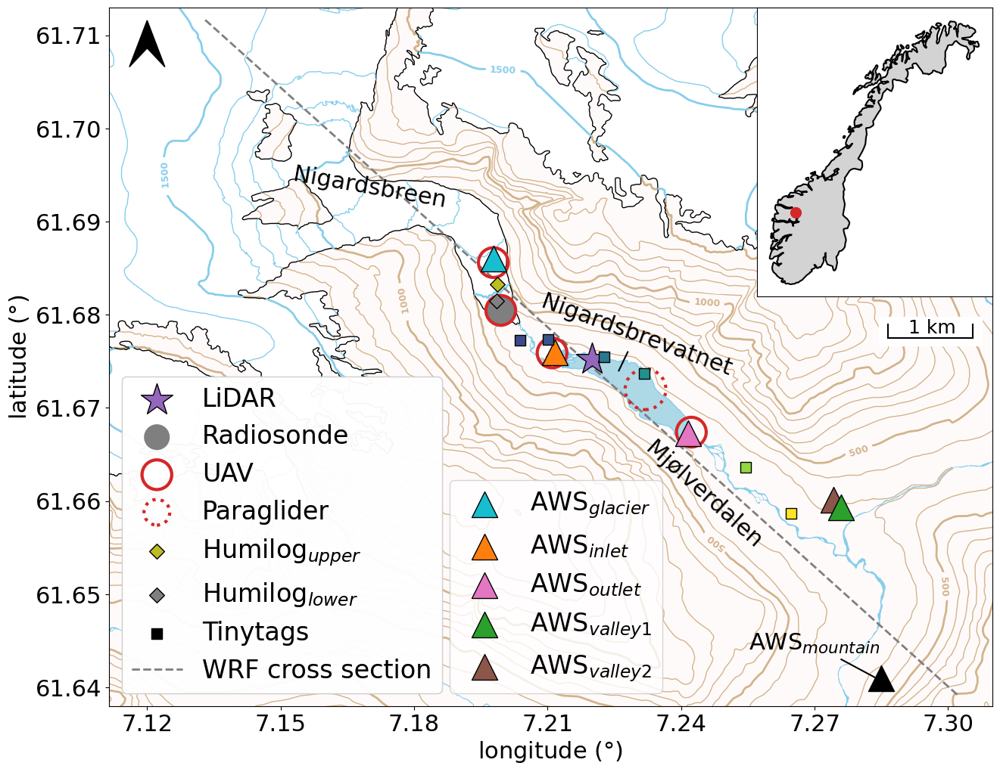

In [13]:
plotMap()

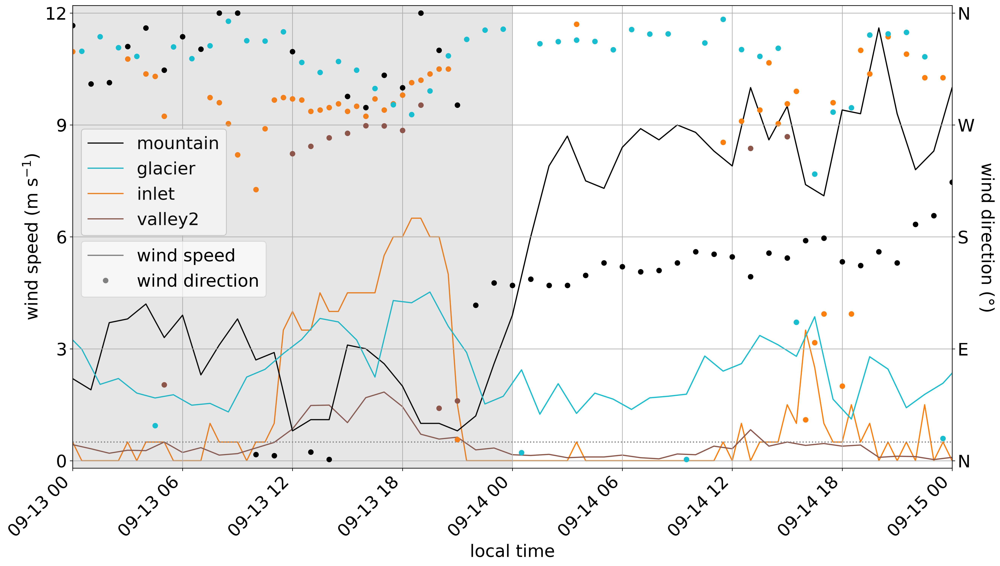

In [19]:
plotWindEvolution()

KeyError: '13-07-Dm'

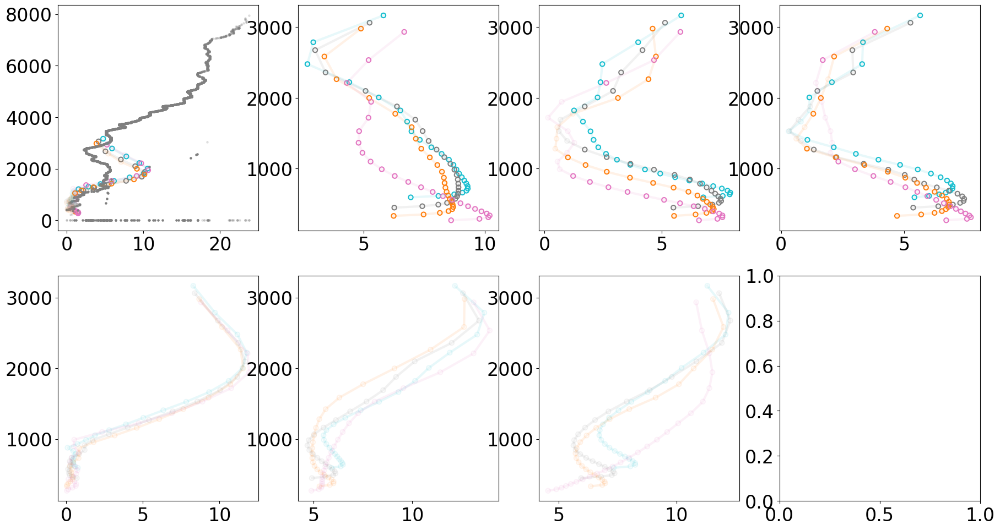

In [25]:
plotVerticalWindProfiles()

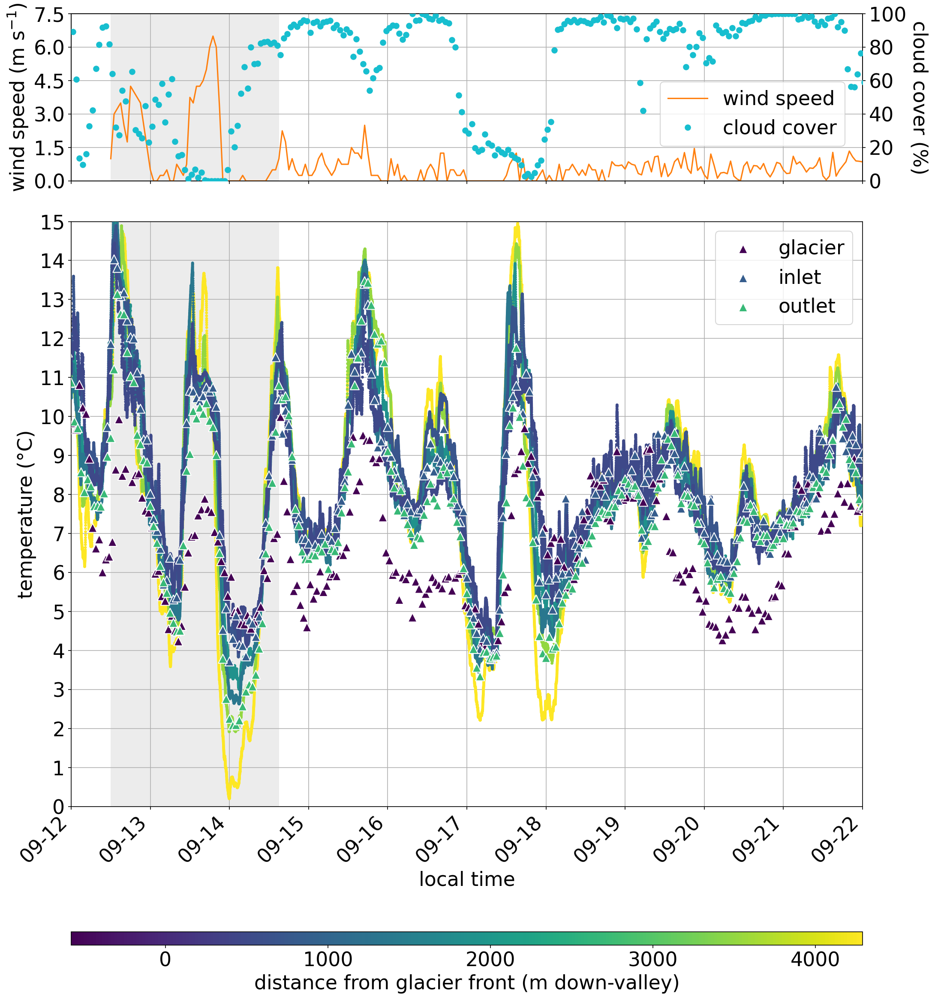

In [21]:
plotColdAirPools()

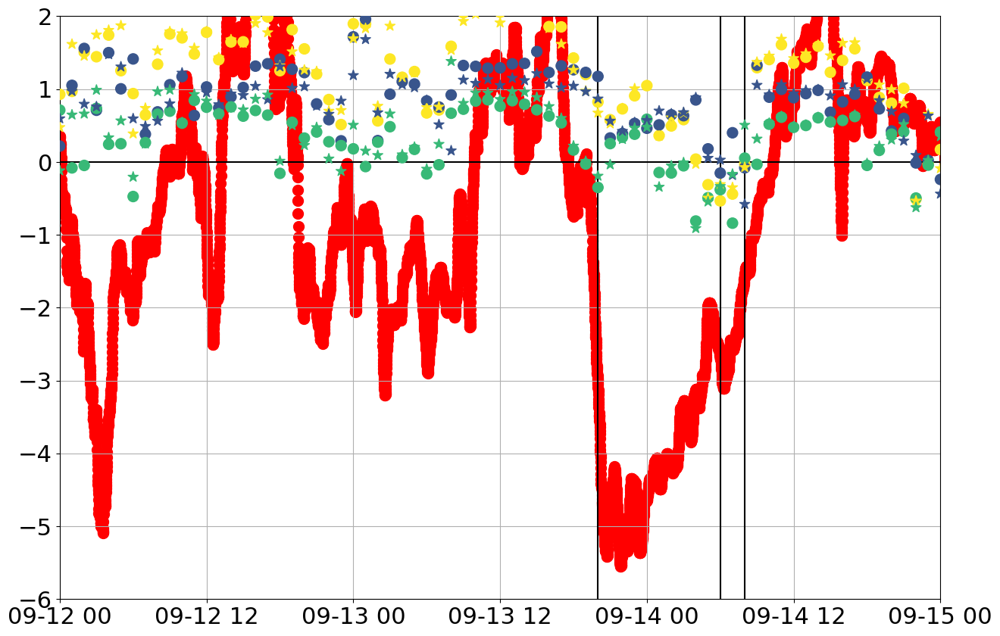

In [48]:
fig,ax = plt.subplots(figsize=(15,10))
dates = np.load(f'wrf_profiles-and-timeseries/surface_temp/dates-for-T2.npy')
markers = ['o','*']
for fl,tl in enumerate(['warm','cold']):
    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_valley-TT.npy')[:,0]-np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_forefield.npy')[:,0], 
               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(4290), marker=markers[fl], s=100, zorder=10000)
#    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_inlet.npy')[:,0], 
#               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(829), marker=markers[fl], s=100, zorder=10000)
    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_outlet.npy')[:,0]-np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_forefield.npy')[:,0], 
               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(703), marker=markers[fl], s=100, zorder=10000)
    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_valley-TT.npy')[:,0]-np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_outlet.npy')[:,0], 
               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(2700), marker=markers[fl], s=100, zorder=10000)
#    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_valley-TT.npy')[:,0], 
#               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(4290), marker=markers[fl], s=100, zorder=10000)

    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_forefield.npy')[:,0], 
               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(703), marker=markers[fl], s=100, zorder=10000)
    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_inlet.npy')[:,0], 
               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(829), marker=markers[fl], s=100, zorder=10000)
    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_outlet.npy')[:,0], 
               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(2700), marker=markers[fl], s=100, zorder=10000)
    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_valley-TT.npy')[:,0], 
               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(4290), marker=markers[fl], s=100, zorder=10000)

ax.scatter(ttFF['date_FF1'], ttFF['t_FF1']-ttFF['t_FF9'], c='r', s=100, zorder=-10)

ax.axhline(0,c='k')
ax.axvline(datetime(2023,9,13,20,0,0),c='k')
ax.axvline(datetime(2023,9,14,6,0,0),c='k')
ax.axvline(datetime(2023,9,14,8,0,0),c='k')

ax.set_xlim(datetime(2023,9,12,0,0,0),datetime(2023,9,15,0,0,0))
ax.set_ylim(-6,2)
ax.grid(True)

In [49]:
# vertical profiles of temperature

path = 'UAV/iMet/'
extension = 'csv'

fns = glob.glob(path+'*.{}'.format(extension))
imets = {}

profiles = ['5','5-US','7','7-US','10','10-US','13','13-US','16']
profiles = profiles[:]#['11']#

outlet = False
inlet = True#False

for ph in profiles:
    for fn in fns:
        print (fn[len(path)+6:len(path)+8],fn[len(path)+25:len(path)+33])
        if (fn[len(path)+6:len(path)+8] == '13') or (fn[len(path)+6:len(path)+8] == '14'):# and (fn[-14:] != 'paraglider.csv'):
            imet = pd.read_csv(fn, sep=',', dtype='string', usecols=['XQ-iMet-XQ Pressure','XQ-iMet-XQ Air Temperature','XQ-iMet-XQ Humidity', 'XQ-iMet-XQ Date', 'XQ-iMet-XQ Time','XQ-iMet-XQ Longitude', 'XQ-iMet-XQ Latitude', 'XQ-iMet-XQ Altitude', 'Profile hour'])
            if imet.empty:
                print(f'DataFrame is empty!')
            else:
                imet = imet.rename(columns={'XQ-iMet-XQ Pressure': 'p', 'XQ-iMet-XQ Air Temperature': 't', 'XQ-iMet-XQ Humidity': 'rh', 'XQ-iMet-XQ Date': 'Date', 'XQ-iMet-XQ Time': 'time', 'XQ-iMet-XQ Longitude': 'lon', 'XQ-iMet-XQ Latitude': 'lat', 'XQ-iMet-XQ Altitude': 'z', 'Profile hour': 'hour'})
                imet = (imet.astype({col: float for col in imet.columns[:3]}))
                imet = (imet.astype({col: float for col in imet.columns[5:8]}))
                imet['pt'] = (imet['t']+273.15)*(1013/imet['p'])**(0.286)
                if fn[-14:] == 'paraglider.csv' or (fn[len(path)+6:len(path)+8] == '12' and fn[-9:] == 'front.csv'):
                    imet['date'] = pd.to_datetime(imet['Date']+' '+imet['time'], format='%d/%m/%Y %H:%M:%S')
                else:
                    imet['date'] = pd.to_datetime(imet['Date']+' '+imet['time'], format='%Y/%m/%d %H:%M:%S')
                del imet['Date'], imet['time']

                if fn[len(path)+25:len(path)+28] != 'gla':
                    imet_tmp = imet.loc[(imet['hour'])==ph]
                    if imet_tmp.empty != True:
                        if fn[-14:] != 'paraglider.csv':
                            imets[fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+28]] = imet_tmp.reset_index(drop=True)
                        else:
                            print ('using paraglider data')
                            imets[fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+28]+'aglider'] = imet_tmp.reset_index(drop=True)
                else:
                    imet_tmp = imet.loc[imet['hour']==ph+'-UP']
                    if imet_tmp.empty != True:
                        imets[fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+28]+'-upper'] = imet_tmp.reset_index(drop=True)
                    imet_tmp = imet.loc[imet['hour']==ph+'-LOW']
                    if imet_tmp.empty != True:
                        imets[fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+28]+'-lower'] = imet_tmp.reset_index(drop=True)
                    #imet_tmp = imet.loc[imet['hour']==ph+'-extra']
                    #if imet_tmp.empty != True:
                    #    imets[fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+28]+'-extra'] = imet_tmp.reset_index(drop=True)
                if imet_tmp.empty:
                    print (fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+35])
                elif fn[len(path)+25:len(path)+28] == 'out':
                    #print (fn, imet_tmp)
                    outlet = True
                elif fn[len(path)+25:len(path)+28] == 'in':
                    inlet = True

13 paraglid
13-5-paraglider
13 front.cs
20 65717_gl
14 inlet.cs
12 glacier.
12 front.cs
12 inlet.cs
12 outlet.c
13 inlet.cs
13-5-inlet.csv
13 outlet.c
13 glacier.
14 glacier.
14 front.cs
13 paraglid
13-5-US-paraglider
13 front.cs
13-5-US-front.csv
20 65717_gl
14 inlet.cs
14-5-US-inlet.csv
12 glacier.
12 front.cs
12 inlet.cs
12 outlet.c
13 inlet.cs
13-5-US-inlet.csv
13 outlet.c
13-5-US-outlet.csv
13 glacier.
13-5-US-glacier.cs
14 glacier.
14-5-US-glacier.cs
14 front.cs
13 paraglid
13-7-paraglider
13 front.cs
20 65717_gl
14 inlet.cs
12 glacier.
12 front.cs
12 inlet.cs
12 outlet.c
13 inlet.cs
13 outlet.c
13 glacier.
14 glacier.
14 front.cs
13 paraglid
13-7-US-paraglider
13 front.cs
13-7-US-front.csv
20 65717_gl
14 inlet.cs
12 glacier.
12 front.cs
12 inlet.cs
12 outlet.c
13 inlet.cs
13-7-US-inlet.csv
13 outlet.c
13-7-US-outlet.csv
13 glacier.
13-7-US-glacier.cs
14 glacier.
14-7-US-glacier.cs
14 front.cs
13 paraglid
13-10-paraglider
13 front.cs
20 65717_gl
14 inlet.cs
12 glacier.
12 front.c

In [13]:
imets.keys()

dict_keys([])

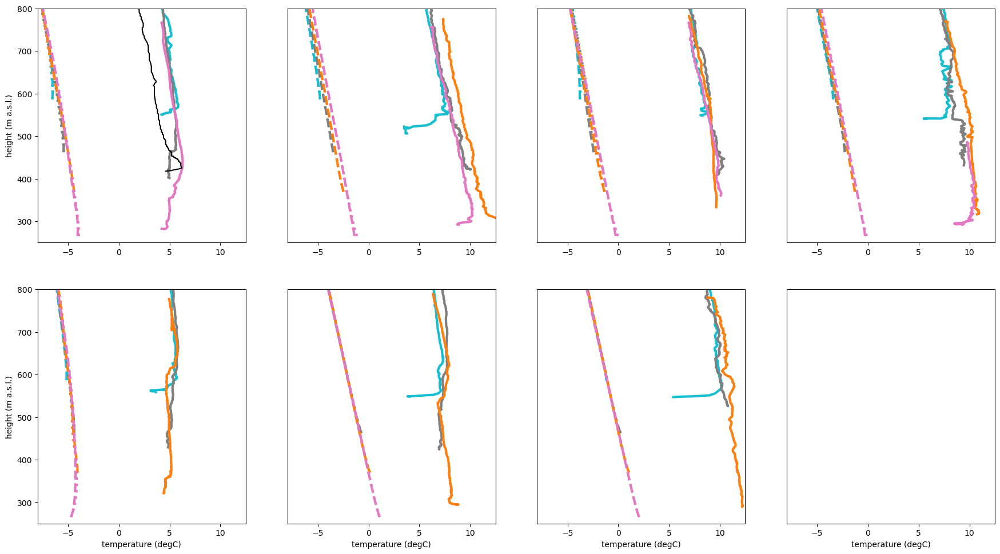

In [62]:
#fig,ax = plt.subplots(figsize=(15,10))
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(24*.9,13*.9))

colours = [c[9],c[7],c[1],c[6]]
for i,h in enumerate(['05','10','13','16']):#'07','12','15','18']):
    #for j,loc in enumerate(['NB', 'front', 'FF', 'NV']):
        #height = np.load(f'wrf_profiles-and-timeseries/height_{loc}.npy')###-100
        #axes[0,i].plot(np.load(f'wrf_profiles-and-timeseries/temp_{loc}_13-{h}.npy'), height, lw=3, ls='--', c=colours[j])
        #if h != '18':
        #    axes[1,i].plot(np.load(f'wrf_profiles-and-timeseries/temp_{loc}_14-{h}.npy'), height, lw=3, ls='--', c=colours[j])
            
    for j,loc in enumerate(['glacier', 'front', 'inlet', 'outlet']):
        height = np.load(f'wrf_profiles-and-timeseries/1pt-profiles/height_{loc}.npy')-100
        axes[0,i].plot(np.load(f'wrf_profiles-and-timeseries/1pt-profiles/T_coldlake_{loc}_13-{h}.npy'), height, lw=3, ls='--', c=colours[j])
        axes[0,i].plot(np.load(f'wrf_profiles-and-timeseries/1pt-profiles/T_warmlake_{loc}_13-{h}.npy'), height, lw=3, ls=':', c=colours[j])
        if h != '16':
            axes[1,i].plot(np.load(f'wrf_profiles-and-timeseries/1pt-profiles/T_coldlake_{loc}_14-{h}.npy'), height, lw=3, ls='--', c=colours[j])
            axes[1,i].plot(np.load(f'wrf_profiles-and-timeseries/1pt-profiles/T_warmlake_{loc}_14-{h}.npy'), height, lw=3, ls=':', c=colours[j])

        #print (f'13-{int(h)-2}-{loc[:3]}')
        #try:
        #    imets[f'13-{int(h)-2}-{loc[:3]}']['t']
        #except:
        #    pass
        #else:
        if loc == 'glacier':
            axes[0,i].plot(imets[f'13-{int(h)}-gla-lower']['t'],imets[f'13-{int(h)}-gla-lower']['z'], lw=3, c=colours[j])
            if h != '16':
                axes[1,i].plot(imets[f'14-{int(h)}-gla-lower']['t'],imets[f'14-{int(h)}-gla-lower']['z'], lw=3, c=colours[j])
        #elif loc == 'outlet':
        #    axes[0,i].plot(imets[f'13-{int(h)}-out']['t'],imets[f'13-{int(h)}-out']['z'], lw=3, c=colours[j])
        else:#if loc == 'front':
            if (loc != 'inlet'):
                axes[0,i].plot(imets[f'13-{int(h)}-{loc[:3]}']['t'],imets[f'13-{int(h)}-{loc[:3]}']['z'], lw=3, c=colours[j])
            elif loc == 'inlet' and h != '05':
                axes[0,i].plot(imets[f'13-{int(h)}-{loc[:3]}']['t'],imets[f'13-{int(h)}-{loc[:3]}']['z'], lw=3, c=colours[j])
            if (h != '16') and (loc != 'outlet'):
                axes[1,i].plot(imets[f'14-{int(h)}-{loc[:3]}']['t'],imets[f'14-{int(h)}-{loc[:3]}']['z'], lw=3, c=colours[j])
        #if loc == 'FF':
        #    if h != '07':
        #        axes[0,i].plot(imets[f'13-{int(h)}-inl']['t'],imets[f'13-{int(h)}-inl']['z'], lw=3, c=colours[j])
        #    if h != '16':
        #        axes[1,i].plot(imets[f'14-{int(h)}-inl']['t'],imets[f'14-{int(h)}-inl']['z'], lw=3, c=colours[j])

axes[0,0].plot(RS4['t'], RS4['z'], c='k')

for i in range(2):
    for j in range(4):
        axes[i,j].set_xlim(-8,12.5)
        axes[i,j].set_ylim(250,800)
        if j != 0:
            axes[i,j].set_yticks([])
        axes[1,j].set_xlabel('temperature (degC)')
    axes[i,0].set_ylabel('height (m a.s.l.)')
    

#### humidity

In [ ]:
fig,ax = plt.subplots(figsize=(20,8),dpi=300)
plt.rcParams.update({'font.size': 22})

#ax.plot(NB['date']+pd.Timedelta(minutes=30),NB['rh_u'],'-',c=c[9], label='glacier')
ax.plot(humilog_upper['date'],humilog_upper['RH'], '-', lw=lw/2, c=c[8],   label='tongue$_{upper}$')
ax.plot(humilog_lower['date'],humilog_lower['RH'], '-', lw=lw/2, c='grey', label='tongue$_{lower}$')
ax.plot(FF['date'],FF['RH'], '-', lw=lw/2, c=c[1], label='inlet')

ax.axvspan(xmin=IOP_start, xmax=IOP_end, ymin=0, ymax=1, facecolor='grey', alpha=0.1)
#ax.axvline(np.datetime64('2023-09-12T16:00:00'),c=c[9],ls='--') # swapped radiometer
#ax.axvline(np.datetime64('2023-09-12T17:00:00'),c=c[9],ls='--') # swapped radiometer
#ax.axvline(np.datetime64('2023-09-13T08:00:00'),c=c[9],ls='--') # swapped hygroclip sensor
ax.set_ylabel('relative humidity (%)')#, c=c[0])
ax.set_ylim(27,100)
ax.tick_params(axis='y')#, colors=c[0])

ax2 = ax.twinx()
#ax.plot(NB['date'],NB['t_u'],'-',c=c[9],lw=lw, label='glacier',zorder=10)
ax2.plot(humilog_upper['date'],humilog_upper['T'], ':', c=c[8], zorder=10)
ax2.plot(humilog_lower['date'],humilog_lower['T'], ':', c='grey', zorder=10)
ax2.plot(FF['date'],FF['T'], ':', c=c[1], zorder=10)
#ax.plot(NV['date'],NV['t'],'-',c=c[6],lw=lw, label='outlet',zorder=10)
#ax.plot(MG['date'],MG['T'],'-',c=c[2],lw=lw, label='valley1',zorder=10)
#ax.plot(BH['date'],BH['t'],'-',c=c[5],lw=lw, label='valley2',zorder=10)

ax2.plot((),(),  '-', lw=lw/2, c='k', label='relative humidity',zorder=10)
ax2.plot((),(),  ':', c='k', label='temperature',zorder=10)
ax2.set_ylabel('temperature (\u00b0C)', rotation=270, labelpad=25)
ax2.set_ylim(0,12)
ax2.legend(loc=3)

ax.set_xlim(start,end)
ax.set_xlim(datetime(2023,9,13,0,0,0),datetime(2023,9,15,0,0,0))
ax.set_xlabel('local time')
fig.autofmt_xdate(rotation=45)
ax.legend(loc=4)
plt.grid()
plt.savefig('plots/plots_campaign/rh.png', format='png')
#plt.savefig('plots/plots_campaign/rh_ext.png', format='png')

plt.show()

#### pressure

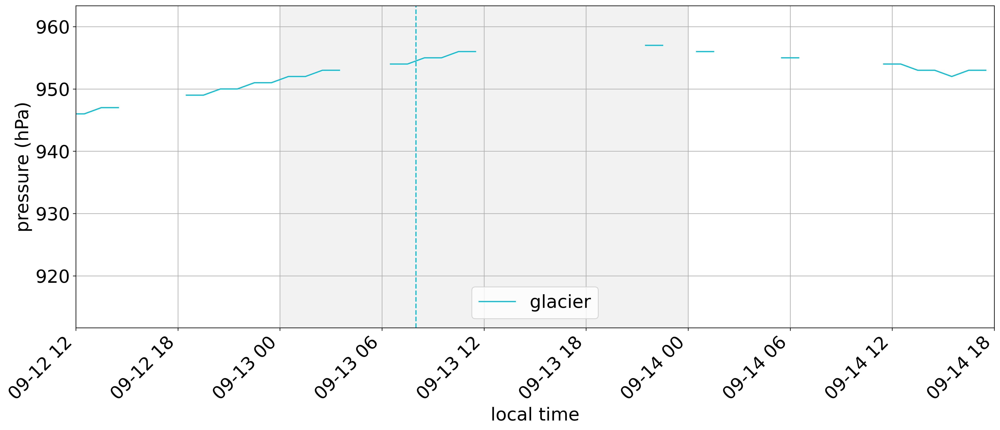

In [87]:
fig,ax = plt.subplots(figsize=(20,8),dpi=300)
plt.rcParams.update({'font.size': 22})

ax.plot(NB['date'],NB['p_u'],'-',c=c[9], label='glacier')

ax.axvspan(xmin=IOP_start, xmax=IOP_end, ymin=0, ymax=1, facecolor='grey', alpha=0.1)
#ax.axvline(np.datetime64('2023-09-12T16:00:00'),c=c[9],ls='--') # swapped radiometer
#ax.axvline(np.datetime64('2023-09-12T17:00:00'),c=c[9],ls='--') # swapped radiometer
ax.axvline(np.datetime64('2023-09-13T08:00:00'),c=c[9],ls='--') # swapped hygroclip sensor
ax.set_ylabel('pressure (hPa)')#, c=c[0])
ax.tick_params(axis='y')#, colors=c[0])

ax.set_xlim(start,end)
#ax.set_xlim(datetime(2023,9,12,12,0,0),datetime(2023,10,18,12,0,0))
ax.set_xlabel('local time')
fig.autofmt_xdate(rotation=45)
plt.legend(loc=8)
plt.grid()
#plt.savefig('plots/plots_campaign/rh.png', format='png')
#plt.savefig('plots/plots_campaign/rh_ext2.png', format='png')

plt.show()

#### radiation

In [ ]:
NB.keys()

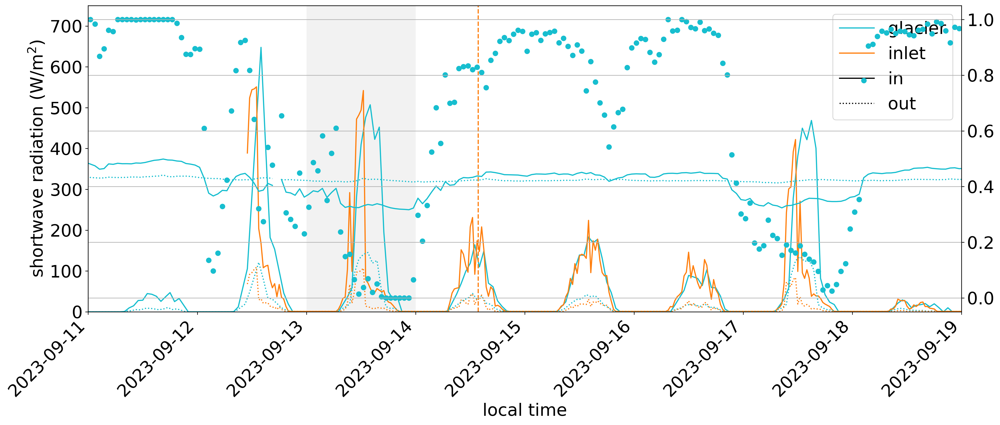

In [64]:
fig,ax = plt.subplots(figsize=(20,8),dpi=300)
plt.rcParams.update({'font.size': 22})

#ax.plot(SM['date'],SM['SW_in'],  '-',c=c[3], label='plateau')
ax.plot(NB['date']+pd.Timedelta(minutes=30),NB['dsr_cor'],'-',c=c[9], label='glacier')
ax.plot(FF['date'],FF['SW_in'],  '-',c=c[1], label='inlet')
ax.plot(NB['date'],NB['usr_cor'],':',c=c[9])
ax.plot(FF['date'],FF['SW_out'], ':',c=c[1])
ax.plot(NB['date'],NB['dlr'],'-',c=c[9])
ax.plot(NB['date'],NB['ulr'],':',c=c[9])
ax2 = ax.twinx()
ax2.scatter(NB['date'],NB['cc'],marker='o',c=c[9])
ax.plot((),(),'-',c='k',label='in')
ax.plot((),(),':',c='k',label='out')

ax.axvspan(xmin=IOP_start, xmax=IOP_end, ymin=0, ymax=1, facecolor='grey', alpha=0.1)
ax.axvline(np.datetime64('2023-09-14T13:45:00'),c=c[1],ls='--') # rotated radiometer on hobo station
ax.set_ylabel('shortwave radiation (W/m${^2}$)')

ax.set_xlim(start,end)
ax.set_xlim(datetime(2023,9,11,0,0,0),datetime(2023,9,19,0,0,0))
ax.set_xlabel('local time')
ax.set_ylim(0,750)
fig.autofmt_xdate(rotation=45)
ax.legend()
plt.grid()
plt.savefig('plots/plots_campaign/rad.png', format='png')

plt.show()

#### precipitation

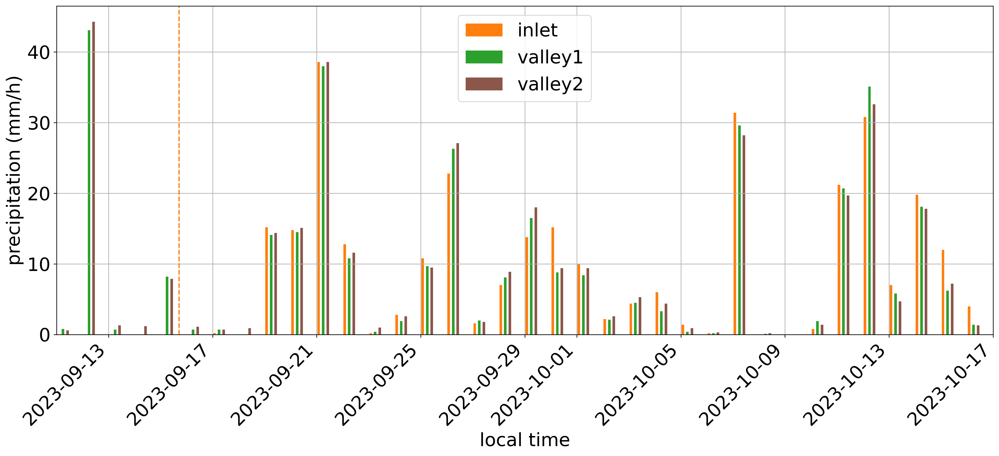

In [91]:
#start = datetime(2023,  9, 17, 0, 0, 0)
#end   = datetime(2023, 10, 17, 0, 0, 0)

fig,ax = plt.subplots(figsize=(20,8),dpi=300)
plt.rcParams.update({'font.size': 22})
offset = pd.Timedelta(hours=4,minutes=11)
w=.1#.01

ax.bar(FF['date']-offset,FF['PREC_day'],width=w,color=c[1], label='inlet')
ax.bar(MG['date']       ,MG['PREC_day'],width=w,color=c[2], label='valley1')
ax.bar(BH['date']+offset,BH['prec_day'],width=w,color=c[5], label='valley2')
ax.axvline(np.datetime64('2023-09-15T17:00:00'),c=c[1],ls='--') # activated rain gauge
ax.set_ylabel('precipitation (mm/h)')

ax.set_xlim(start,end)
ax.set_xlim(datetime(2023,  9, 11, 0, 0, 0),datetime(2023, 10, 17, 0, 0, 0))
ax.set_xlabel('local time')
#ax.set_ylim(0,2)
fig.autofmt_xdate(rotation=45)
plt.legend(loc=9)
plt.grid()
#plt.savefig('plots/plots_extended-period/precip.png', format='png')

plt.show()

In [99]:
BH.loc[(BH['date']>datetime(2023,9,14))&(BH['date']<datetime(2023,9,15))]

,date,prec,wd,ws,t,hour,prec_day
96,2023-09-14 01:00:00,0.0,348.81,0.14,3.93,1,NaN
97,2023-09-14 02:00:00,0.0,350.00,0.17,3.86,2,NaN
98,2023-09-14 03:00:00,0.0,4.98,0.08,3.72,3,NaN
99,2023-09-14 04:00:00,0.0,295.95,0.10,3.80,4,NaN
100,2023-09-14 05:00:00,0.0,70.89,0.10,4.00,5,NaN
101,2023-09-14 06:00:00,0.0,280.16,0.15,3.94,6,1.2
102,2023-09-14 07:00:00,0.1,338.07,0.08,3.79,7,NaN
103,2023-09-14 08:00:00,0.0,282.01,0.05,4.30,8,NaN
104,2023-09-14 09:00:00,0.1,72.25,0.18,4.72,9,NaN
105,2023-09-14 10:00:00,0.0,255.50,0.16,5.56,10,NaN


### interpolate data and plot it

In [49]:
# point data

glacier_aws =  (7.197794684331172, 61.686051540061946, 550)#601) # imet 601-611 #550) #, c=c[9], alpha=alp, ec=ec, marker=m, s=s1, label='AWS$_{glacier}$',   zorder=2)
upper_tongue = (7.198646470752097, 61.683231702332485, 480)#545) # 480) #, alpha=alp, c=c[8], ec='k', marker='D', s=s2, zorder=1, label='Humilog$_{upper}$')
lower_tongue = (7.198529491371879, 61.6814934541163,   462)#426 #524) # 426) #, alpha=alp, c='grey', ec='k', marker='D', s=s2, zorder=1, label='Humilog$_{lower}$')
# front @ 493-495 m
inlet_aws =    (7.211611010507808, 61.675952354678884, 277) # imet 277-289 #302 #, c=c[1], alpha=alp, ec=ec, marker=m, s=s1, label='AWS$_{inlet}$', zorder=2)
outlet_aws =   (7.2415509,         61.6672661,         276) # imet 276-277 #292)        #, c=c[6], alpha=alp, ec=ec, marker=m, s=s1, label='AWS$_{outlet}$', zorder=2)


#ax.plot(NB['date'],NB['t_u'],'-',c=c[9],lw=lw, label='glacier',zorder=10)
#ax.plot(humilog_upper['date'],humilog_upper['T'],  '-',c=c[8],  lw=lw, label='tongue$_{upper}$',zorder=10)
#ax.plot(humilog_lower['date'],humilog_lower['T'],  '-',c='grey',lw=lw, label='tongue$_{lower}$',zorder=10)
#ax.plot(FF['date'],FF['T'],  '-',c=c[1],lw=lw, label='inlet',zorder=10)
#ax.plot(NV['date'],NV['t'],  '-',c=c[6],lw=lw, label='outlet',zorder=10)

#for d,t,i in zip(ttFF.columns[0::2],ttFF.columns[1::2],range(len(ttFF.columns[0::2]))):
#    ax2.plot(ttFF[d],ttFF[t],#.rolling(window=50, center=True).mean(),
#             c=cm.cool((8-i)/8),label=d[5:], zorder=-10)

In [50]:
pt_gla = Point(glacier_aws[1], glacier_aws[0]) # glacier
pt_tup = Point(upper_tongue[1], upper_tongue[0]) # upper tongue
pt_tlo = Point(lower_tongue[1], lower_tongue[0]) # lower tongue
pt_fro = Point(61.6805, 7.1993) # front
pt_inl = Point(inlet_aws[1], inlet_aws[0]) # inlet
pt_out = Point(outlet_aws[1], outlet_aws[0]) # outlet

In [51]:
# load already stored intalts
def load_intalts():
    with open(f'interpolation/kristines_adaption/intalts/intalts_{t[:5]}.txt', "r") as file:
        intalts = file.read()
        intalts = ast.literal_eval(intalts)
    return intalts
def load_intaltsext():
    with open(f'interpolation/kristines_adaption/intalts/intaltsext_{t[:5]}.txt', "r") as file:
        intalts_extended = file.read()
        intalts_extended = ast.literal_eval(intalts_extended)
    return intalts_extended

In [52]:
# find elevation of points from updated DEM
dem_uav_path = 'DEM/Nigardsbreen140923_10cm_DSM.tif'
dem_uav_path = 'DEM/Nigardsbreen_Wingtra_DSM_aligned.tif'
dem_hd_path = '../HPC, WRF and modelling/høydedata_processed/Jostedalsbreen_10m.tif'
update_intalts_from_DEM = True

def get_elevation(lon, lat, dataset):
    # Transform coordinates to the dataset's CRS
    transformer = Transformer.from_crs("epsg:4326", dataset.crs, always_xy=True)
    x, y = transformer.transform(lon, lat)

    # Get row and column in the image for the given coordinate
    row, col = rowcol(dataset.transform, x, y)

    # Check if the row and column are within the bounds of the image
    if (0 <= row < dataset.height) and (0 <= col < dataset.width):
        # Read the dataset's values at the discovered row and column
        value = dataset.read(1)[row, col]
        return value
    else:
        # Return NaN if the coordinate is outside the raster
        return np.nan
    return value

def get_intalts(intpts, path=dem_uav_path):
    if update_intalts_from_DEM == True:
        with rasterio.open(path) as dataset:
            elevations_uav = [get_elevation(lon, lat, dataset) for lat, lon in intpts]
        with rasterio.open(dem_hd_path) as dataset:
            elevations_hd = [get_elevation(lon, lat, dataset) for lat, lon in intpts]
        
    elevations_uav = [e if e > 0 else np.nan for e in elevations_uav] #375
    elevations_hd = [e if e > 0 else np.nan for e in elevations_hd] #375 
    return elevations_uav, elevations_hd #intalts

In [53]:
def interpolate_array(array, n, x, arraytype='normal'):
    original_length = len(array)
    original_indices = np.linspace(0, original_length-1, original_length)
    new_length = (n-1)*x + 1
    new_indices = np.linspace(0, original_length-1, new_length)
    if arraytype == 'coord':
        interpolated_lat = np.interp(new_indices, original_indices, [coord[0] for coord in array])
        interpolated_lon = np.interp(new_indices, original_indices, [coord[1] for coord in array])
        interpolated_array = list(zip(interpolated_lat, interpolated_lon))
    else:
        interpolated_array = np.interp(new_indices, original_indices, array)
    return interpolated_array

def get_intaltsext(intpts, path=dem_uav_path):
    # create extended intalts for final plot
    intpts_extended = interpolate_array(intpts, len(intpts), 10, 'coord')
    print ('diff in intpts and intptsext: ', np.array(intpts_extended[::10])-np.array(intpts))
    with rasterio.open(path) as dataset:
        elevations_uav = [get_elevation(lon, lat, dataset) for lat, lon in intpts_extended]
    with rasterio.open(dem_hd_path) as dataset:
        elevations_hd = [get_elevation(lon, lat, dataset) for lat, lon in intpts_extended]
        
    elevations_uav = [e if e > 0 else np.nan for e in elevations_uav]
    elevations_hd = [e if e > 0 else np.nan for e in elevations_hd] 
    return elevations_uav, elevations_hd

In [54]:
def interpolate_coordinates(coordinates, n, x):
    original_length = len(coordinates)
    original_indices = np.linspace(0, original_length-1, original_length)
    new_length = n*x + 1
    new_indices = np.linspace(0, original_length-1, new_length)

    interpolated_lat = np.interp(new_indices, original_indices, [coord[0] for coord in coordinates])
    interpolated_lon = np.interp(new_indices, original_indices, [coord[1] for coord in coordinates])

    interpolated_coordinates = list(zip(interpolated_lat, interpolated_lon))
    return interpolated_coordinates

In [55]:
def add_obs(interpolated_dist_z, target_dists, target_zs, obsloc, ndint=False):
    if obsloc == 'outlet':
        xind = np.where(target_dists >= xind_outlet)[1][0]
        zind = np.where(target_zs == round(outlet_aws[2]))[0][0]
        if ndint == False:
            zind = 0
        tobs = NV.loc[NV['date']>=date,'t'].iloc[0]
    elif obsloc == 'inlet':
        xind = np.where(target_dists >= xind_inlet)[1][0]
        zind = np.where(target_zs == round(inlet_aws[2]))[0][0]
        if ndint == False:
            zind = 0
        if var == 't':
            tobs = FF.loc[FF['date']>=date,'T'].iloc[0]
        elif var == 'rh':
            tobs = FF.loc[FF['date']>=date,'RH'].iloc[0]
    print (xind,zind)
    print (f'old value: {interpolated_dist_z[zind,xind]}')
    interpolated_dist_z[zind,xind] = tobs
    print (f'new value: {interpolated_dist_z[zind,xind]}')
    
    if ndint == True:
        # update interpolated field with new point
        non_nan_indices = np.where(~np.isnan(interpolated_dist_z))
        points = np.column_stack(non_nan_indices)
        values = interpolated_dist_z[non_nan_indices]
        interpolator = LinearNDInterpolator(points, values)
        all_indices = np.indices(interpolated_dist_z.shape)
        interpolated_dist_z = interpolator(all_indices[0],all_indices[1])
    return interpolated_dist_z

In [552]:
path = 'UAV/iMet/'
extension = 'csv'

fns = glob.glob(path+'*.{}'.format(extension))
imets = {}

profiles = ['5','5-US','7','7-US','10','10-US','13','13-US','16']
profiles = profiles[:2]#['11']#

outlet = False
inlet = True#False

for ph in profiles:
    for fn in fns:
        print (fn[len(path)+6:len(path)+8],fn[len(path)+25:len(path)+33])
        if (fn[len(path)+6:len(path)+8] == '13'):# and (fn[-14:] != 'paraglider.csv'):
            imet = pd.read_csv(fn, sep=',', dtype='string', usecols=['XQ-iMet-XQ Pressure','XQ-iMet-XQ Air Temperature','XQ-iMet-XQ Humidity', 'XQ-iMet-XQ Date', 'XQ-iMet-XQ Time','XQ-iMet-XQ Longitude', 'XQ-iMet-XQ Latitude', 'XQ-iMet-XQ Altitude', 'Profile hour'])
            if imet.empty:
                print(f'DataFrame is empty!')
            else:
                imet = imet.rename(columns={'XQ-iMet-XQ Pressure': 'p', 'XQ-iMet-XQ Air Temperature': 't', 'XQ-iMet-XQ Humidity': 'rh', 'XQ-iMet-XQ Date': 'Date', 'XQ-iMet-XQ Time': 'time', 'XQ-iMet-XQ Longitude': 'lon', 'XQ-iMet-XQ Latitude': 'lat', 'XQ-iMet-XQ Altitude': 'z', 'Profile hour': 'hour'})
                imet = (imet.astype({col: float for col in imet.columns[:3]}))
                imet = (imet.astype({col: float for col in imet.columns[5:8]}))
                imet['pt'] = (imet['t']+273.15)*(1013/imet['p'])**(0.286)
                if fn[-14:] == 'paraglider.csv' or (fn[len(path)+6:len(path)+8] == '12' and fn[-9:] == 'front.csv'):
                    imet['date'] = pd.to_datetime(imet['Date']+' '+imet['time'], format='%d/%m/%Y %H:%M:%S')
                else:
                    imet['date'] = pd.to_datetime(imet['Date']+' '+imet['time'], format='%Y/%m/%d %H:%M:%S')
                del imet['Date'], imet['time']

                if fn[len(path)+25:len(path)+28] != 'gla':
                    imet_tmp = imet.loc[(imet['hour'])==ph]
                    if imet_tmp.empty != True:
                        if fn[-14:] != 'paraglider.csv':
                            imets[fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+28]] = imet_tmp.reset_index(drop=True)
                        else:
                            print ('using paraglider data')
                            imets[fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+28]+'aglider'] = imet_tmp.reset_index(drop=True)
                else:
                    imet_tmp = imet.loc[imet['hour']==ph+'-UP']
                    if imet_tmp.empty != True:
                        imets[fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+28]+'-upper'] = imet_tmp.reset_index(drop=True)
                    imet_tmp = imet.loc[imet['hour']==ph+'-LOW']
                    if imet_tmp.empty != True:
                        imets[fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+28]+'-lower'] = imet_tmp.reset_index(drop=True)
                    #imet_tmp = imet.loc[imet['hour']==ph+'-extra']
                    #if imet_tmp.empty != True:
                    #    imets[fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+28]+'-extra'] = imet_tmp.reset_index(drop=True)
                if imet_tmp.empty:
                    print (fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+35])
                elif fn[len(path)+25:len(path)+28] == 'out':
                    #print (fn, imet_tmp)
                    outlet = True
                elif fn[len(path)+25:len(path)+28] == 'in':
                    inlet = True

13 paraglid
13-5-paraglider
13 front.cs
20 65717_gl
14 inlet.cs
12 glacier.
12 front.cs
12 inlet.cs
12 outlet.c
13 inlet.cs
13-5-inlet.csv
13 outlet.c
13 glacier.
14 glacier.
14 front.cs
13 paraglid
13-5-US-paraglider
13 front.cs
13-5-US-front.csv
20 65717_gl
14 inlet.cs
12 glacier.
12 front.cs
12 inlet.cs
12 outlet.c
13 inlet.cs
13-5-US-inlet.csv
13 outlet.c
13-5-US-outlet.csv
13 glacier.
13-5-US-glacier.cs
14 glacier.
14 front.cs


In [553]:
outlet, inlet

(True, True)

In [554]:
sorted_keys = sorted(imets, key=lambda x: imets[x].loc[0, 'lat'])
imets = {key: imets[key] for key in sorted_keys}
#imets.keys()
#imets['12-11-out']

[7.2423468, 7.1992806, 7.1980333] [61.6672052, 61.680418, 61.6858897] [282.526, 401.85, 550.53]
location of radiosonde below 1263.5


/tmp/ipykernel_53404/41868905.py:67: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/tmp/ipykernel_53404/41868905.py:67: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docum

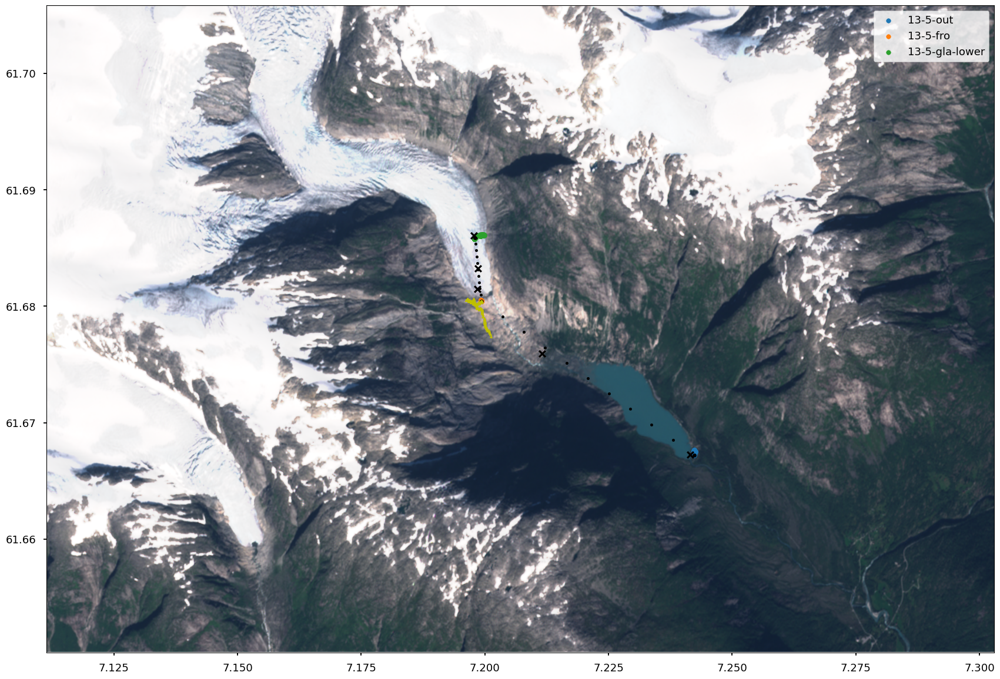

In [555]:
#times = ['13-5', '13-7', '13-10', '13-13']#, '13-16']#, '14-05', '13-07', '13-10', '13-13']
#times = [f'14-10']#{ph}']#'13-5']
#times = ['14-5', '14-7', '14-10', '14-13']

# read data
im = plt.imread('map/2022-08-31-00_00_2022-08-31-23_59_Sentinel-2_L1C_True_color_Gjerde.png')#2023-08-31-00_00_2023-08-31-23_59_Sentinel-2_L1C_True_color.png')

fig,ax = plt.subplots()#figsize=(20,20))
zoom = 2
w, h = fig.get_size_inches()
fig.set_size_inches(w * zoom, h * zoom)

xmin=7.111416#18#
xmax=7.30299#2#
ymin=61.650282#683#
ymax=61.705824#69#

ax.imshow(im, extent=[xmin,xmax,ymin,ymax], aspect='auto')

lons = []
lats = []
alts = []

if outlet == False:
    print ('adding outlet')
    lons.append(outlet_aws[0])
    lats.append(outlet_aws[1])
    alts.append(outlet_aws[2])
if inlet == False:
    print ('adding inlet')
    lons.append(inlet_aws[0])
    lats.append(inlet_aws[1])
    alts.append(inlet_aws[2])

for t in imets:#profiles:#times:
    if imets[t].empty:
        print(f'DataFrame {t} is empty!') # shouldn't be necessary any longer
    else:
        imet_tmp = imets[t]

        # define points for interpolation line
        if t[-10:] != 'paraglider':
            lons.append(imet_tmp['lon'].values[0])
            lats.append(imet_tmp['lat'].values[0])
            alts.append(imet_tmp['z'].values[0])
        else:
            print ('adding paraglider')
            lons.append(imet_tmp['lon'].values.mean())
            lats.append(imet_tmp['lat'].values.mean())
            alts.append(280)#imet_tmp['z'].values[-1])
        ax.scatter(imet_tmp['lon'],imet_tmp['lat'],s=30,label=f'{t}')
        ax.set_xlim(xmin,xmax)
        ax.set_ylim(ymin,ymax)
        plt.legend()

print (lons, lats, alts)
        
intpts = []
intline = {}

intline[t[:4]] = pd.DataFrame(columns=['lons','lats','alts','pts'])
intline[(t[:4])]['lons'] = lons
intline[t[:4]]['lats'] = lats
intline[t[:4]]['alts'] = alts
intline[t[:4]] = intline[t[:4]].sort_values(by=['lats']).reset_index(drop=True) # shouldn't be necessary any longer
for i in range(len(intline[t[:4]]['alts'].values)):
    intline[t[:4]]['pts'][i] = Point(intline[t[:4]]['lats'][i],intline[t[:4]]['lons'][i])
    if i == 0:
        intpts.extend(([intline[t[:4]]['pts'][0].coords[0]]))
    else:
        line = (LineString([intline[t[:4]]['pts'][i-1],intline[t[:4]]['pts'][i]]))
        for div in np.arange(0.1,1,0.1):
            intpts.extend(line.interpolate(div, normalized=True).coords[:])
        intpts.extend(([intline[t[:4]]['pts'][i].coords[0]]))

for i in range(len(intpts)):
    ax.scatter(intpts[i][1],intpts[i][0],c='k',s=10)
    if (i%10) == 0:
        ax.scatter(intpts[i][1],intpts[i][0],c='k',s=20)
ax.scatter(glacier_aws[0], glacier_aws[1], c='k', marker='x', s=60)
ax.scatter(upper_tongue[0],upper_tongue[1], c='k', marker='x', s=60)
ax.scatter(lower_tongue[0],lower_tongue[1], c='k', marker='x', s=60)
ax.scatter(inlet_aws[0],inlet_aws[1], c='k', marker='x', s=60)
ax.scatter(outlet_aws[0],outlet_aws[1], c='k', marker='x', s=60)

# find index where balloon has drifted more than 0.002 in latitude direction:
if t[:5] == '13-5-':
    RS4_ind = np.where(abs(RS4.loc[0,'lat']-RS4['lat'])>0.003)[0][0]
    max_height = RS4.loc[RS4_ind,'z']
    print (f'location of radiosonde below {max_height}')
    ax.scatter(RS4.loc[:RS4_ind,'lon'], RS4.loc[:RS4_ind,'lat'], c='y', marker='^', s=10)

if t[:5] == '12-11':
    RS2_ind = np.where(abs(RS2.loc[0,'lat']-RS2['lat'])>0.003)[0][0]
    max_height = RS2.loc[RS2_ind,'z']
    print (f'location of radiosonde below {max_height}')
    ax.scatter(RS2.loc[:RS2_ind,'lon'], RS2.loc[:RS2_ind,'lat'], c='y', marker='^', s=10)

plt.savefig(f'interpolation/kristines_adaption/figures/map_{t[:5]}.png')

In [556]:
intpts

[(61.6672052, 7.2423468),
 (61.66852648, 7.23804018),
 (61.669847759999996, 7.23373356),
 (61.67116904, 7.22942694),
 (61.67249032, 7.22512032),
 (61.6738116, 7.2208137),
 (61.67513288, 7.2165070799999995),
 (61.67645416, 7.21220046),
 (61.677775440000005, 7.20789384),
 (61.679096720000004, 7.20358722),
 (61.680418, 7.1992806),
 (61.68096517, 7.19915587),
 (61.681512340000005, 7.19903114),
 (61.68205951, 7.198906409999999),
 (61.68260668, 7.19878168),
 (61.68315385, 7.19865695),
 (61.68370102, 7.19853222),
 (61.68424819, 7.19840749),
 (61.684795359999995, 7.19828276),
 (61.68534253, 7.19815803),
 (61.6858897, 7.1980333)]

In [557]:
# find surface altitude of each coordinate on interpolation line
try:
    intalts = load_intalts() #intalts# = intalts_stored[t[:5]]
except:
    elevations_uav, elevations_hd = get_intalts(intpts, dem_uav_path) # dem_uav_path or dem_hd_path
    intalts_hd = elevations_hd
    intalts = [elevations_uav[i] if not np.isnan(elevations_uav[i]) else elevations_hd[i] for i in range(len(elevations_uav))]
    # save altitudes from DEM along interpolation line to file
    with open(f'interpolation/kristines_adaption/intalts/intalts_{t[:5]}.txt', 'w') as f:
        f.write(f"{intalts}\n")
    print ('created new intalts')
else:
    print ('using already stored intalts')

try:
    intalts_extended = load_intaltsext() #intalts# = intalts_stored[t[:5]]
except:
    elevations_uav, elevations_hd = get_intaltsext(intpts, dem_uav_path)
    intalts_extended_hd = elevations_hd
    intalts_extended = [elevations_uav[i] if not np.isnan(elevations_uav[i]) else elevations_hd[i] for i in range(len(elevations_uav))]
    with open(f'interpolation/kristines_adaption/intalts/intaltsext_{t[:5]}.txt', 'w') as f:
        f.write(f"{intalts_extended}\n")
    print ('created new intalts_extended')
else:
    print ('using already stored intalts_extended')

using already stored intalts
using already stored intalts_extended


In [558]:
# calculate distance along interpolation line
intdist = [0]
geod = Geod(ellps="WGS84")

for i in range(1,len(intpts)):
    line_string = (LineString([intpts[i],intpts[i-1]]))
    intdist.extend([intdist[-1]+geod.geometry_length(line_string)])

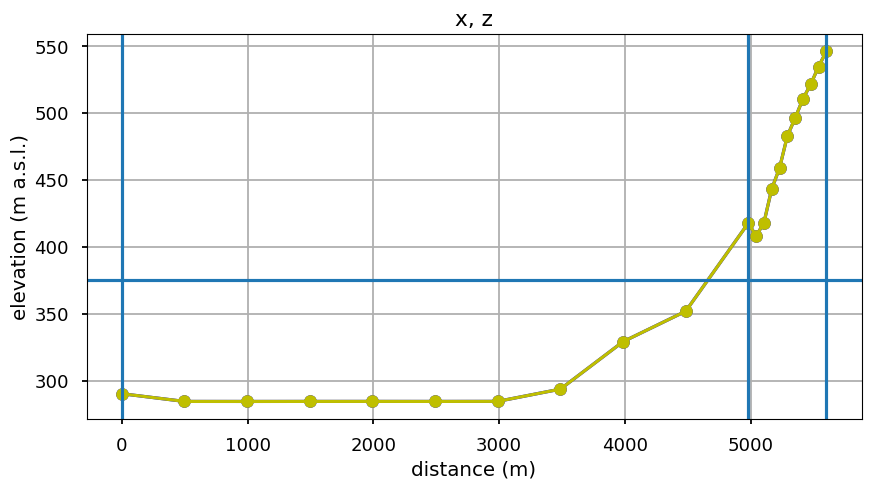

In [559]:
# check interpolation line
fig, ax = plt.subplots(figsize=(10,5))
plt.plot(intdist, intalts_extended[::10], marker='o', linestyle='-', c='blue')
#plt.plot(intdist, intalts_extended_hd[::10], marker='o', linestyle='-', c='red')
plt.plot(intdist, intalts, marker='o', linestyle='-', c='y')
for i in range(0,len(intdist),10):
    plt.axvline(intdist[i])
plt.axhline(375)
plt.title('x, z')
plt.xlabel('distance (m)')
plt.ylabel('elevation (m a.s.l.)')
plt.grid(True)
plt.show()

In [560]:
# adding outlet data to dateframe dictionary if missing
fs = list(imets.keys())[0]
day = fs[:2]
hour = fs[3:4]
if fs[3] == '1':
    hour = fs[3:5]
#print ('day:', day,'hour:', int(hour)+2)
date = datetime(2023,9,int(day),int(hour)+2,0,0)
if len(intalts[::10])-len(imets) == 1:
    print ('let us add something')
    if outlet == False and inlet == True:
        print ('adding outlet observation')
    #    print (date, NV.loc[NV['date']>=date,'t'].iloc[0])
        sorted_keys_new = np.append(f'{fs[:5]}-outlet', sorted_keys)#, list(imets.keys())
        imets[f'{fs[:5]}-outlet'] = pd.DataFrame(columns=imets[sorted_keys[0]].columns)
        imets[f'{fs[:5]}-outlet'].loc[0] = np.ones(len(imets[f'{fs[:5]}-outlet'].columns))*np.nan
        imets[f'{fs[:5]}-outlet'].loc[0,'t'] = NV.loc[NV['date']>=date,'t'].iloc[0]
        imets[f'{fs[:5]}-outlet'].loc[0,'lon'] = outlet_aws[0]
        imets[f'{fs[:5]}-outlet'].loc[0,'lat'] = outlet_aws[1]
        imets[f'{fs[:5]}-outlet'].loc[0,'z'] = outlet_aws[2]
        imets = ({k: imets[k] for k in sorted_keys_new})
        print (imets[f'{fs[:5]}-outlet'])
    elif outlet == True and inlet == False:
        print ('adding inlet observation')
        sorted_keys.insert(1,f'{fs[:5]}-inlet') # preparing to add df to 2nd entry of dictionary   #np.append(f'{fs[:5]}-inlet', sorted_keys)#, list(imets.keys())
        imets[f'{fs[:5]}-inlet'] = pd.DataFrame(columns=imets[sorted_keys[0]].columns)
        imets[f'{fs[:5]}-inlet'].loc[0] = np.ones(len(imets[f'{fs[:5]}-inlet'].columns))*np.nan
        imets[f'{fs[:5]}-inlet'].loc[0,'t'] = FF.loc[FF['date']>=date,'T'].iloc[0]
        imets[f'{fs[:5]}-inlet'].loc[0,'lon'] = inlet_aws[0]
        imets[f'{fs[:5]}-inlet'].loc[0,'lat'] = inlet_aws[1]
        imets[f'{fs[:5]}-inlet'].loc[0,'z'] = inlet_aws[2]

        #sorted_keys = sorted(imets, key=lambda x: imets[x].loc[0, 'lat'])
        #imets = {key: imets[key] for key in sorted_keys}
        
        imets = ({k: imets[k] for k in sorted_keys})
        print (imets[f'{fs[:5]}-inlet'])

/tmp/ipykernel_53404/2495667603.py:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_53404/2495667603.py:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_53404/2495667603.py:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykerne

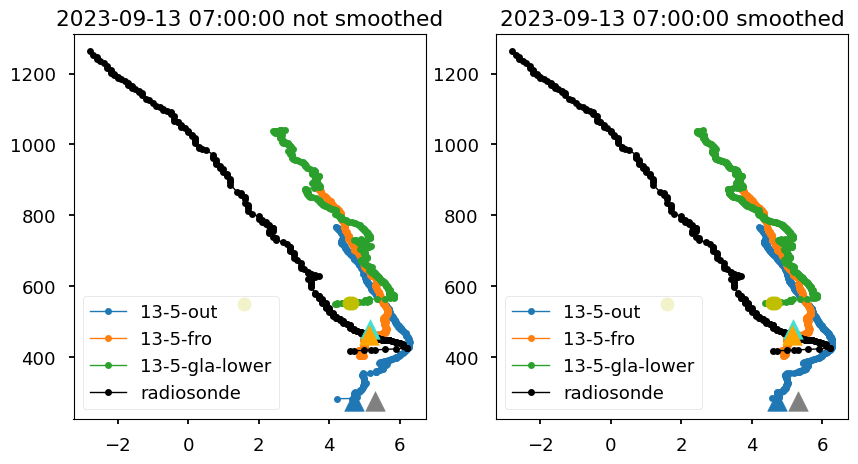

In [578]:
processed_dfs = []

var = 't'

fig, (ax1,ax2) = plt.subplots(1,2,figsize=(10,5))
    
selected_columns = ['z',var]

for df_tmp in imets:
    #if df_tmp == '13-13-paraglider':
        #print (imets[df_tmp])#[selected_columns])
        #print (df_tmp)
    if imets[df_tmp].empty:
        print(f'DataFrame is empty!')
    else:
        #print (df_tmp['date'].iloc[0])
        # Select specific columns
        df_selected = imets[df_tmp][selected_columns]

        # for ascents:
        # Add a column to track the cumulative maximum of 'z' so far for each row    
        df_selected['max_z'] = df_selected['z'].copy()#################
        df_selected['max_z'] = df_selected['max_z'].cummax()
        
        if df_tmp != '13-13-paraglider':
            # Filter the DataFrame to keep only the rows where 'z' equals its cumulative maximum (except paraglider flight)
            df_selected = df_selected[df_selected['z'] == df_selected['max_z']].drop(columns='max_z')
        else:
            df_selected = df_selected.drop(columns='max_z')

        # Sort the DataFrame by the 'z' column in ascending order
        df_selected_sorted = df_selected.sort_values(by='z', ascending=True)
        #if (df_selected.equals(df_selected_sorted)) == False:
        #    for x,y,i,j in zip(df_selected[var],df_selected_sorted[var],df_selected[var].index,df_selected_sorted[var].index):
        #        #print ('ind', i)
        #        if x != y:
        #            print (x,y,i,j)#,df_selected.iloc[i],df_selected_sorted.iloc[i])

        # Round the 'z' values and calculate the mean for each group
        df_selected_sorted['zr'] = df_selected_sorted['z'].round()
        #print (df_selected_sorted['zr'])

        #print (df_selected_sorted)
        df_selected_sorted = df_selected_sorted.groupby('zr').mean()
        #print (df_selected_sorted)

        # fill gaps in data
        df_selected_tmp = pd.DataFrame({'zr': np.arange(min(df_selected_sorted.reset_index()['zr']),max(df_selected_sorted.reset_index()['zr'])+1,1)})
        df_selected_sorted = pd.merge(df_selected_tmp, df_selected_sorted, how='outer', on='zr') #.fillna(0)
        df_selected_sorted = df_selected_sorted.interpolate(method='linear', axis=0)

        # Calculate the rolling mean of the sorted DataFrame
        if len(df_selected_sorted) != 1:
            df_selected_sorted_smoothed = df_selected_sorted.rolling(3).mean()
        else:
            df_selected_sorted_smoothed = df_selected_sorted
        #print (df_selected_sorted_smoothed)
        if df_tmp == '13-13-paraglider':
            print (df_selected)
        # Plotting temp vs z
        ax1.plot(df_selected[var], df_selected['z'], marker='o', ls='-', lw=1, ms=5, label=df_tmp)#imets[df_tmp]['lat'].iloc[0])
        ax2.plot(df_selected_sorted_smoothed[var], df_selected_sorted_smoothed['z'], marker='o', ls='-', lw=1, ms=5, label=df_tmp)#imets[df_tmp]['lat'].iloc[0])
        #plt.savefig(loc_fig)

        # Add the processed DataFrame to the list
        if len(df_selected_sorted) != 1:
            processed_dfs.append(df_selected_sorted_smoothed[2:].reset_index(drop=True))  #first two rows are nans due to smoothing 
        else:
            processed_dfs.append(df_selected_sorted_smoothed.reset_index(drop=True))
        
if t[:5] == '12-11':
    ax1.plot(RS2.loc[:RS2_ind,var], RS2.loc[:RS2_ind,'z'], c='k', marker='o', ls='-', lw=1, ms=5, label='radiosonde')
    ax2.plot(RS2.loc[:RS2_ind,var], RS2.loc[:RS2_ind,'z'], c='k', marker='o', ls='-', lw=1, ms=5, label='radiosonde')
if t[:5] == '13-5-':
    ax1.plot(RS4.loc[:RS4_ind,var], RS4.loc[:RS4_ind,'z'], c='k', marker='o', ls='-', lw=1, ms=5, label='radiosonde')
    ax2.plot(RS4.loc[:RS4_ind,var], RS4.loc[:RS4_ind,'z'], c='k', marker='o', ls='-', lw=1, ms=5, label='radiosonde')

if var == 't':
    ax1.plot(ttNB.loc[ttNB['date_N5_']==date,['t_N5_']], glacier_aws[2]+2.79, c='y', marker='o', ls='-', lw=1, ms=2*5)
    ax1.plot(ttNB.loc[ttNB['date_N4_']==date,['t_N4_']], glacier_aws[2]+1.79, c='y', marker='o', ls='-', lw=1, ms=2*5)
    ax1.plot(ttNB.loc[ttNB['date_N3_']==date,['t_N3_']], glacier_aws[2], c='y', marker='o', ls='-', lw=1, ms=2*5)
    #ax1.plot(ttNB.loc[ttNB['date_N3_']==date,['t_N3_']], glacier_aws[2], c='y', marker='o', ls='-', lw=1, ms=2*5, label='tinytags')
    ax1.scatter(humilog_upper.loc[humilog_upper['date']>=date,'T'].iloc[0],upper_tongue[2], c='turquoise', s=200, marker='^', zorder=1000)
    ax1.scatter(humilog_lower.loc[humilog_upper['date']>=date,'T'].iloc[0],lower_tongue[2], c='orange', s=200, marker='^', zorder=1000)
    ax1.scatter(FF.loc[FF['date']>=date,'T'].iloc[0],inlet_aws[2], c='grey', marker='^', s=200, zorder=1000)
    ax1.scatter(NV.loc[NV['date']>=date,'t'].iloc[0],outlet_aws[2], marker='^', s=200, zorder=1000)
    ax2.plot(ttNB.loc[ttNB['date_N5_']==date,['t_N5_']], glacier_aws[2]+2.79, c='y', marker='o', ls='-', lw=1, ms=2*5)
    ax2.plot(ttNB.loc[ttNB['date_N4_']==date,['t_N4_']], glacier_aws[2]+1.79, c='y', marker='o', ls='-', lw=1, ms=2*5)
    ax2.plot(ttNB.loc[ttNB['date_N3_']==date,['t_N3_']], glacier_aws[2], c='y', marker='o', ls='-', lw=1, ms=2*5)
    #ax2.plot(ttNB.loc[ttNB['date_N3_']==date,['t_N3_']], glacier_aws[2], c='y', marker='o', ls='-', lw=1, ms=2*5, label='tinytags')
    ax2.scatter(humilog_upper.loc[humilog_upper['date']>=date,'T'].iloc[0],upper_tongue[2], c='turquoise', s=200, marker='^', zorder=1000)
    ax2.scatter(humilog_lower.loc[humilog_upper['date']>=date,'T'].iloc[0],lower_tongue[2], c='orange', s=200, marker='^', zorder=1000)
    ax2.scatter(FF.loc[FF['date']>=date,'T'].iloc[0],inlet_aws[2], c='grey', marker='^', s=200, zorder=1000)
    ax2.scatter(NV.loc[NV['date']>=date,'t'].iloc[0],outlet_aws[2], marker='^', s=200, zorder=1000)

ax1.set_title(f'{date} not smoothed')
ax1.legend(loc='best')
ax2.set_title(f'{date} smoothed')
ax2.legend(loc='best')

plt.savefig(f'interpolation/kristines_adaption/figures/profiles_{var}_{t[:5]}.png')

In [579]:
#plt.plot(RS2['p'], RS2['z'], label='RS2')
#plt.plot(RS4['p'], RS4['z'], label='RS4')
#for imet in imets:
#    plt.plot(imets[imet]['p'], imets[imet]['z'], label=imet)
#
##plt.scatter(FF.loc[FF['date']==date,'PRES'].iloc[0],inlet_aws[2], c='grey', marker='^', s=200, cmap=cmap, norm=norm, zorder=1000)
#plt.scatter(np.mean([NB.loc[NB['date']<date,'p_u'].iloc[-1],NB.loc[NB['date']>date,'p_u'].iloc[0]]), glacier_aws[2], ec='k', marker='^', s=200, zorder=1000)
#
#plt.xlim(800,1050)
#plt.ylim(270,1100)
#plt.xlabel('pressure (hPa)')
#plt.ylabel('altitude (m)')
#plt.title(imet[:5])
#plt.legend()

In [580]:
z_dist = []
for i in range(len(processed_dfs)):
    if processed_dfs[i].empty:
        print(f'DataFrame {[i]} is empty!')
    else:
        z_dist.extend([np.min(processed_dfs[i]['zr'])])

shifting profile nr 0 up 6.199700000000007 meters
shifting profile nr 1 up 14.710699999999974 meters


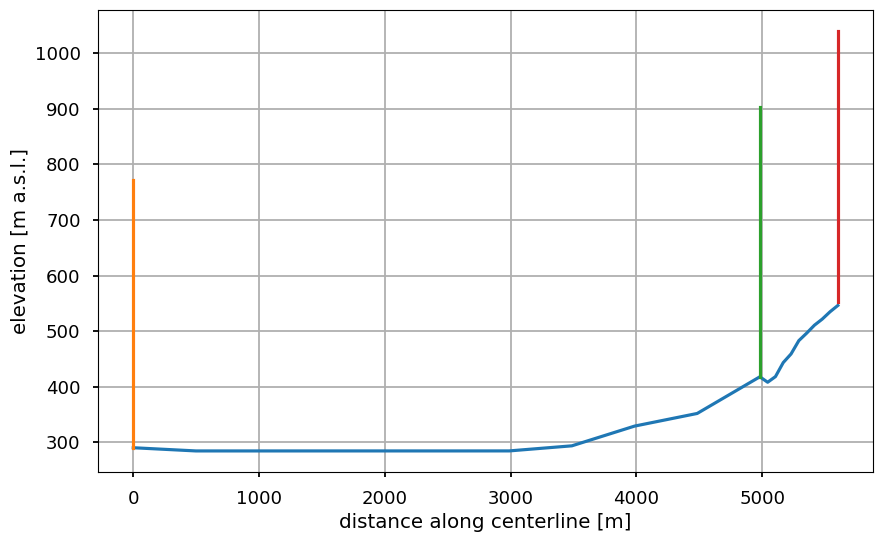

In [581]:
# Define a list of distances
dist = intdist[0::10] #list(round(hor_up.loc[hor_up['ascents'] != 'nan','x']))### distance along centerline
dist = [round(x) for x in dist]

# Adding a 'dist' column to each DataFrame with corresponding values from the 'dist' list
for i in range(len(processed_dfs)):
    processed_dfs[i]['dist'] = dist[i]

fig, ax2 = plt.subplots(nrows=1, figsize=(10, 6))
plt.style.use('seaborn-v0_8-talk')

# the 'z' needs to be shifted so that the lowest (first) value is the value of intalts for the corresponding location

def shift_z(df):
    d = df['dist'].iloc[0]
    idx = np.abs(intdist - d).argmin()
    z_base = intalts[idx]
    return df['z'] - df['z'].min() + z_base

cntr1 = plt.plot(intdist, intalts)
for i in range(len(processed_dfs)):
    if shift_z(processed_dfs[i])[0] > processed_dfs[i]['z'][0]:
        print (f'shifting profile nr {i} up {shift_z(processed_dfs[i])[0] - processed_dfs[i]['z'][0]} meters')
        processed_dfs[i]['z_shifted'] = shift_z(processed_dfs[i])
    else:
        # not shifting down
        processed_dfs[i]['z_shifted'] = processed_dfs[i]['z']
    cntr1 = plt.plot(processed_dfs[i]['dist'], processed_dfs[i]['z_shifted'])

ax2.set_xlabel('distance along centerline [m]')
ax2.set_ylabel('elevation [m a.s.l.]')
ax2.grid()

In [582]:
#z_start = [np.min(processed_dfs[i]['z_shifted']) for i in range(len(processed_dfs))]
z_end   = [np.max(processed_dfs[i]['z_shifted']) for i in range(len(processed_dfs))]
start_level = 195
end_level = np.max(z_end)
x_plot = interpolate_array(intdist, len(intdist), 10)
z_plot = np.arange(start_level, end_level+1, 1)
xdim = len(x_plot)
zdim = len(z_plot)
xs, zs = np.meshgrid(x_plot, z_plot)

# creating empty 2D array (xyspacenew) for interpolation purposes
# first entry of each column is ground level (not a specific altitude level)
xyspacenew = np.ones((xdim, zdim,))*np.nan

# populating the xyspacenew array with variable values from each df
for idx, df in enumerate(processed_dfs):
    row_index = idx*100
    start_index = int(np.nanmin(df['z_shifted'])-intalts[idx*10]) # set profile position relative to ground level
    if start_index < 0:
        print ('profile shifted up to ground level')
        start_index = 0 # ensure all profiles start at or above ground
    end_index = start_index+df['z_shifted'].count()
    print (start_index,end_index)
    xyspacenew[row_index, start_index:end_index] = df[var]  # assign t/pt/rh values to the array from bottom of profile and up
    
xyspacenew = xyspacenew.T

0 483
0 487
5 494


In [583]:
# add outlet/inlet near surface observation if missing
ex = '-' # extra string needed for imet keys with 2 digit hour (i.e., 10, 13, 16)
if t[4] == '-':
    ex = ''
    
add_glacier_obs = True
add_inlet_obs = True
add_outlet_obs = True

if var == 't':
    try:
        imets[t[:5]+ex+'gla-lower']
    except:
        pass
    else:
        if np.isnan(xyspacenew[2,list(imets.keys()).index(t[:5]+ex+'gla-lower')*100]):
            if add_glacier_obs == True:
                print ('adding glacier near-surface observation and interpolating linearly up to start of vertical profile')
                first_nonnan = np.where(np.isnan(xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'gla-lower')*100])==False)[0][0]
                #print (xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'gla-lower')*100])
                xyspacenew[1,list(imets.keys()).index(t[:5]+ex+'gla-lower')*100] = ttNB.loc[ttNB['date_N3_']==date,'t_N3_']
                #if np.isnan(xyspacenew[1,list(imets.keys()).index(t[:5]+ex+'gla-lower')*100]):
                xyspacenew[2,list(imets.keys()).index(t[:5]+ex+'gla-lower')*100] = ttNB.loc[ttNB['date_N4_']==date,'t_N4_']
                #    if np.isnan(xyspacenew[2,list(imets.keys()).index(t[:5]+ex+'gla-lower')*100]):
                xyspacenew[3,list(imets.keys()).index(t[:5]+ex+'gla-lower')*100] = ttNB.loc[ttNB['date_N5_']==date,'t_N5_']
                        #print (xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'gla-lower')*100])
                first_nan = np.where(np.isnan(xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'gla-lower')*100]))[0][0]
        
                x = np.array([first_nan-1, first_nonnan])#, 1)
                y = xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'gla-lower')*100]#[first_nan-1:first_nonnan+1]
                y = np.array([y[first_nan-1],y[first_nonnan]])
                f = interpolate.interp1d(x, y, kind='linear', bounds_error=False, fill_value='extrapolate')
                x_new = np.arange(first_nan, first_nonnan, 1)
                xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'gla-lower')*100][first_nan:first_nonnan] = f(x_new)
        #        print (xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'gla-lower')*100][first_nan:first_nonnan])
            else:
                print ('consider adding glacier observation because profile starts above surface')
    try:
        imets[t[:5]+ex+'out']
    except:
        pass
    else:
        if np.isnan(xyspacenew[0,list(imets.keys()).index(t[:5]+ex+'out')*100]): #imets[t[:5]+'out']['z'][0] > outlet_aws[2]+10:
            if add_outlet_obs == True:
                print ('adding outlet near-surface observation and interpolating linearly up to start of vertical profile')
                first_nonnan = np.where(np.isnan(xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'out')*100])==False)[0][0]
                #print (xyspacenew[:40,list(imets.keys()).index(t[:5]+ex+'out')*100])
                #xyspacenew[0,list(imets.keys()).index(t[:5]+ex+'inl')*100] = 
                xyspacenew[0,list(imets.keys()).index(t[:5]+ex+'out')*100] = NV.loc[NV['date']>=date,'t'].iloc[0]
                #print (xyspacenew[:40,list(imets.keys()).index(t[:5]+ex+'out')*100])
                first_nan = np.where(np.isnan(xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'out')*100]))[0][0]
        
                x = np.array([first_nan-1, first_nonnan])#, 1)
                y = xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'out')*100]#[first_nan-1:first_nonnan+1]
                y = np.array([y[first_nan-1],y[first_nonnan]])
                f = interpolate.interp1d(x, y, kind='linear', bounds_error=False, fill_value='extrapolate')
                x_new = np.arange(first_nan, first_nonnan, 1)
                xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'out')*100][first_nan:first_nonnan] = f(x_new)
                #print (x, y, x_new, f(x_new))
                #print (xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'out')*100][first_nan:first_nonnan])
                #print (xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'inl')*100])
            else:
                print ('adding outlet observation without interpolating up')
                xyspacenew = add_obs(xyspacenew, xs, zs, 'outlet')
if var == 't' or var == 'rh':
    try:
        imets[t[:5]+ex+'inl']
    except:
        print ('adding inlet observation without interpolating up')
        xyspacenew = add_obs(xyspacenew, xs, zs, 'inlet')
    else:
        if np.isnan(xyspacenew[0,list(imets.keys()).index(t[:5]+ex+'inl')*100]):
        #if imets[t[:5]+'inl']['z'][0] > inlet_aws[2]+10:
            if add_inlet_obs == True:
                try:
                    first_nonnan = np.where(np.isnan(xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'inl')*100])==False)[0][0]
                except:
                    print ('adding inlet observation without interpolating up')
                    xyspacenew = add_obs(xyspacenew, xs, zs, 'inlet')
                else:
                    print ('adding inlet near-surface observation and interpolating linearly up to start of vertical profile')
                    #print (xyspacenew[:20,list(imets.keys()).index(t[:5]+ex+'inl')*100])
                    #xyspacenew[0,list(imets.keys()).index(t[:5]+ex+'inl')*100] = 
                    if var == 't':
                        xyspacenew[0,list(imets.keys()).index(t[:5]+ex+'inl')*100] = FF.loc[FF['date']>=date,'T'].iloc[0]
                    elif var == 'rh':
                        xyspacenew[0,list(imets.keys()).index(t[:5]+ex+'inl')*100] = FF.loc[FF['date']>=date,'RH'].iloc[0]
                    #xyspacenew = add_obs(xyspacenew, xs, zs, 'inlet')
                    #print (xyspacenew[:20,list(imets.keys()).index(t[:5]+ex+'inl')*100])
                    first_nan = np.where(np.isnan(xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'inl')*100]))[0][0]
            
                    x = np.array([first_nan-1, first_nonnan])#, 1)
                    y = xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'inl')*100]#[first_nan-1:first_nonnan+1]
                    y = np.array([y[first_nan-1],y[first_nonnan]])
                    f = interpolate.interp1d(x, y, kind='linear', bounds_error=False, fill_value='extrapolate')
                    x_new = np.arange(first_nan, first_nonnan, 1)
                    xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'inl')*100][first_nan:first_nonnan] = f(x_new)
                    #print (xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'inl')*100][first_nan:first_nonnan])
                    #print (xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'inl')*100])
            else:
                print ('adding inlet observation without interpolating up')
                xyspacenew = add_obs(xyspacenew, xs, zs, 'inlet')
        
#        print ('adding outlet observation because profile starts more than 10 m above surface')
#        print (xyspacenew[:,list(imets.keys()).index(t[:5]+ex+'out')*100])

adding glacier near-surface observation and interpolating linearly up to start of vertical profile
adding inlet observation without interpolating up
70 0
old value: nan
new value: 5.31


/tmp/ipykernel_53404/559334406.py:21: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_53404/559334406.py:23: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_53404/559334406.py:25: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead



In [584]:
# locations along interpolation line
closest_point_outlet = min(intpts, key=lambda x: pt_out.distance(Point(x)))
xind_outlet = intdist[intpts.index(closest_point_outlet)]
closest_point_inlet = min(intpts, key=lambda x: pt_inl.distance(Point(x)))
xind_inlet = intdist[intpts.index(closest_point_inlet)]
closest_point_front = min(intpts, key=lambda x: pt_fro.distance(Point(x)))
xind_front = intdist[intpts.index(closest_point_front)]
closest_point_tonlow = min(intpts, key=lambda x: pt_tlo.distance(Point(x)))
xind_tonlow = intdist[intpts.index(closest_point_tonlow)]
closest_point_tonup = min(intpts, key=lambda x: pt_tup.distance(Point(x)))
xind_tonup = intdist[intpts.index(closest_point_tonup)]
closest_point = min(intpts, key=lambda x: pt_gla.distance(Point(x)))
xind_glacier = intdist[intpts.index(closest_point)]

In [585]:
# update altitude of humilog with closest point to interpolation line
#lower_tongue[2] = intalts[intpts.index(closest_point_tonlow)]
#upper_tongue[2] = intalts[intpts.index(closest_point_tonup)]

In [586]:
# adding humilog observations
print (xyspacenew[0:5,intpts.index(closest_point_tonlow)*10])
if var == 't':
    xyspacenew[1,intpts.index(closest_point_tonlow)*10] = humilog_lower.loc[humilog_lower['date']>=date,'T'].iloc[0]
    xyspacenew[1,intpts.index(closest_point_tonup)*10] = humilog_upper.loc[humilog_upper['date']>=date,'T'].iloc[0]
elif var == 'rh':
    xyspacenew[1,intpts.index(closest_point_tonlow)*10] = humilog_lower.loc[humilog_lower['date']>=date,'RH'].iloc[0]
    xyspacenew[1,intpts.index(closest_point_tonup)*10] = humilog_upper.loc[humilog_upper['date']>=date,'RH'].iloc[0]
#print (xyspacenew[0,:])
print (xyspacenew[0:5,intpts.index(closest_point_tonlow)*10])

[nan nan nan nan nan]
[    nan 5.13797     nan     nan     nan]


In [587]:
# setting the surface temperature equal to 0 deg over the melting glacier
xyspacenew[0,np.where(x_plot == xind_front)[0][0]+1:] = 0
# setting the surface temperature equal to 3 deg over the proglacial lake (average lake temp during IOP)
xyspacenew[0,1:np.where(x_plot == xind_inlet)[0][0]] = 4

In [588]:
#xyspacenew[1]

In [589]:
# Create a mask to identify rows that contain only NaN or zero values
#mask = np.all(np.isnan(xyspacenew) | np.equal(xyspacenew, 0), axis=1)
# Filter out these rows from the xyspacenew array
#xyspacenew = xyspacenew[~mask]

# Interpolate NaN values in the xyspacenew array
for row in xyspacenew:
    mask = np.isnan(row)   # identify nans
    x = np.where(~mask)[0] # first value on row without nan
    y = row[~mask]         # values on row without nan
    #print (row, y, x)
    if len(x) > 1:  # Make sure there are at least two points to interpolate
        f = interpolate.interp1d(x, y, kind='linear', bounds_error=False, fill_value='extrapolate')
        x_new = np.where(mask)[0] # Only interpolate points that are NaN
        x_new_valid = x_new[(x_new >= min(x)) & (x_new <= max(x))] # only interpolate points within the range of x
        row[mask] = np.nan  # Set all masked values to NaN for now
        row[x_new_valid] = f(x_new_valid)  # Only interpolate valid points
    else:
        #If there are fewer than two points, leave the NaN values as they are
        continue

# shift columns up to altitude level
for idx, col in enumerate(xyspacenew.T):
    z_shift = int(intalts_extended[idx])-start_level
    col[z_shift:] = col[:-z_shift]
    col[:z_shift] = np.nan

In [590]:
# prepare plot

cmap = plt.cm.coolwarm#RdBu_r#viridis#
if var == 't':
    vmin, vmax = 278,284
    cblab = 'air temperature (\u00b0C)'#K)'#
elif var == 'rh':
    vmin, vmax = 30,90
    cblab = 'relative humidity (%)'
    cmap = plt.cm.RdBu
elif var == 'pt':
    vmin, vmax = 278, 288 #8,14
    cblab = 'potential temperature (K)'#\u00b0C)'
norm = Normalize(vmin=vmin, vmax=vmax)
levels = np.linspace(vmin, vmax, 16)
mappable = ScalarMappable(norm=norm, cmap=cmap)

add = 0
if var == 't':
    add = 273.15
def add_observations(ax):
    for df, alt in zip(imets, intalts_extended[::100]):
        df = imets[df]
        if np.min(df['z']) < alt: # shift profiles up if they start too low
            df['z'] += alt-np.min(df['z'])
            print (np.min(df['z']), alt, intalts_extended[-1]-np.min(df['z']))
        ax.scatter(df['xind'][::3],df['z'][::3],c=df[var][::3]+add, ec='k', marker='o', s=10, cmap=cmap, norm=norm, zorder=900)
        scatter = ax.scatter(df['xind'][::3],df['z'][::3],c=df[var][::3]+add, ec='none', marker='o', s=8, cmap=cmap, norm=norm, zorder=1000)
        #dfxind,dfz = np.meshgrid(df['xind'],df['z'])
        #plt.pcolormesh(dfxind,dfz,df[var])
    
#    if t[:5] == '12-11':       
#        ax.scatter(np.ones(len(RS2.loc[:RS2_ind]))*xind_front, RS2.loc[:RS2_ind,'z'], c=RS2.loc[:RS2_ind,var]+add, ec='k', marker='s', s=12, cmap=cmap, norm=norm, zorder=900)
#        scatter = ax.scatter(np.ones(len(RS2.loc[:RS2_ind]))*xind_front, RS2.loc[:RS2_ind,'z'], c=RS2.loc[:RS2_ind,var]+add, ec='none', marker='s', s=10, cmap=cmap, norm=norm, zorder=1000)
#    if t[:5] == '13-5-':       
#        ax.scatter(np.ones(len(RS4.loc[:RS4_ind]))*xind_front, RS4.loc[:RS4_ind,'z'], c=RS4.loc[:RS4_ind,var]+add, ec='k', marker='s', s=12, cmap=cmap, norm=norm, zorder=900)
#        scatter = ax.scatter(np.ones(len(RS4.loc[:RS4_ind]))*xind_front, RS4.loc[:RS4_ind,'z'], c=RS4.loc[:RS4_ind,var]+add, ec='none', marker='s', s=10, cmap=cmap, norm=norm, zorder=1000)
        
    if var == 't':
        sc1 = ax.scatter(xind_glacier,glacier_aws[2]+2.79,c=ttNB.loc[ttNB['date_N5_']==date,'t_N5_']+add, ec='k', marker='o', s=100, cmap=cmap, norm=norm, zorder=1000)
        sc2 = ax.scatter(xind_glacier,glacier_aws[2]+1.79,c=ttNB.loc[ttNB['date_N3_']==date,'t_N3_']+add, ec='k', marker=MarkerStyle('o', fillstyle='bottom'), s=100, cmap=cmap, norm=norm, zorder=1100)
        #print (ttNB.loc[ttNB['date_N5_']==date,'t_N5_'],ttNB.loc[ttNB['date_N5_']==date,'t_N5_'])
        #plt.scatter(xind_glacier,glacier_aws[2],c=ttNB.loc[ttNB['date_N3_']==date,'t_N3_'], ec='k', marker='o', s=10, cmap=cmap, norm=norm, zorder=1000)
        #plt.scatter(xind_glacier,glacier_aws[2],c=np.mean([NB.loc[NB['date']<date, 't_u'].iloc[-1],NB.loc[NB['date']>date, 't_u'].iloc[0]]), ec='k', marker='^', s=200, cmap=cmap, norm=norm, zorder=1000)
        if t[:2] == '13':
            sc3 = ax.scatter(x_plot[0],outlet_aws[2]+5,c=NV.loc[NV['date']>=date,'t'].iloc[0]+add, ec='k', marker='o', s=100, cmap=cmap, norm=norm, zorder=1000)
        else:
            sc3 = sc2
    if var == 't':
        var2 = 'T'
    elif var == 'rh':
        var2 = 'RH'
    ax.scatter(xind_tonup,intalts[intpts.index(closest_point_tonup)],c=humilog_upper.loc[humilog_upper['date']>=date,var2].iloc[0]+add, ec='k', s=50, marker='o', cmap=cmap, norm=norm, zorder=1000)
    ax.scatter(xind_tonlow,intalts[intpts.index(closest_point_tonlow)],c=humilog_lower.loc[humilog_upper['date']>=date,var2].iloc[0]+add, ec='k', s=50, marker='o', cmap=cmap, norm=norm, zorder=1000)
    sc4 = ax.scatter(xind_inlet,intalts[intpts.index(closest_point_inlet)],c=FF.loc[FF['date']>=date,var2].iloc[0]+add, ec='k', marker='o', s=100, cmap=cmap, norm=norm, zorder=1000)
    return ax, sc1, sc2, sc3, sc4

In [591]:
# add ice thickness
df = pd.read_excel('nigard_ice.xlsx')
df.columns = ['lon', 'lat', 'elevation', 'thickness']

intpts_extended = interpolate_array(intpts, len(intpts), 10, 'coord')

from scipy.spatial import KDTree
coordinates = df[['lon', 'lat']].values
tree = KDTree(coordinates)

thickness_array = []
for coord in intpts_extended:
    dis, idx = tree.query(coord)
    thickness = df['thickness'].iloc[idx]
    thickness_array.append(thickness)
thickness_array = np.array(thickness_array)
thickness_array[thickness_array < 5] = 0

In [592]:
# estimate point on interpolation line for all UAV measurements in imets:
for df in imets:
    df = imets[df]
    df['xind'] = df['z']
    for i in range(len(df)):
        closest_point = min(intpts, key=lambda x: (Point(df.loc[i]['lat'],df.loc[i]['lon'])).distance(Point(x)))
        df.loc[i,'xind'] = intdist[intpts.index(closest_point)]

In [593]:
if var == 'pt':
    pt_contours = xyspacenew

cannot find lake inlet
plotting glacier line


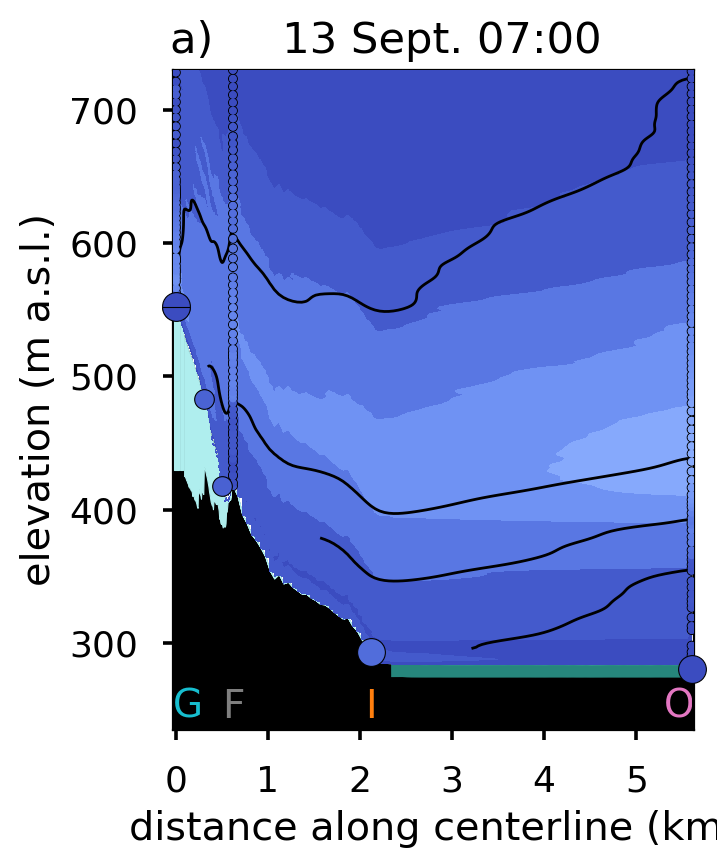

5631.184810351132


In [595]:
# plot
#xs = np.flip(xs)
from scipy.ndimage import gaussian_filter

#fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10, 8))
import matplotlib.gridspec as gridspec
#%matplotlib inline
#plt.ion()

ff=.8

if t[:2] == '13':
    fig,ax1 = plt.subplots(1, figsize=(8*3/4*ff*.84, 6*ff), dpi=200)
    #gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1])  # Width ratio of 3:1 for ax1 and ax2
    #ax1 = fig.add_subplot(gs[0, 0])
    #ax2 = fig.add_subplot(gs[0, 1])
elif t[:2] == '14':
    fig,ax1 = plt.subplots(1, figsize=(5*32/54*ff*1.08, 6.3*ff), dpi=200)
    #gs = gridspec.GridSpec(1, 2, width_ratios=[32, 22])  # Width ratio of 3:1 for ax1 and ax2
    #ax1 = fig.add_subplot(gs[0, 0])
    #ax2 = fig.add_subplot(gs[0, 1])

#plt.rcParams.update({'font.size': 12})

plt.style.use('seaborn-v0_8-talk')
#plt.plot(x_plot, intalts_extended, c='k', zorder=100)
ax1.fill_between(x_plot, intalts_extended, start_level, linestyle='-', color='k', zorder=10)
ax1.fill_between(x_plot, intalts_extended-thickness_array, intalts_extended, linestyle='-', color='paleturquoise', zorder=10)
ax1.fill_between([-30,0], [intalts_extended[0], intalts_extended[0]], start_level, linestyle='-', color='k', zorder=10)
ax1.fill_between([-30,0], [intalts_extended[0]-thickness_array[0], intalts_extended[0]-thickness_array[0]], [intalts_extended[0], intalts_extended[0]], linestyle='-', color='paleturquoise', zorder=10)
ax1.fill_between([5526, 5558], 0, intalts_extended[-1], linestyle='-', color='k', zorder=10)
ax1.fill_between([5526, 5558], intalts_extended[-1]-thickness_array[-1], intalts_extended[-1], linestyle='-', color='paleturquoise', zorder=10)

if var == 't' or var == 'rh':
    cntr1 = ax1.contourf(xs,zs,xyspacenew+add, cmap=cmap, norm=norm, levels=levels, extend='both', zorder=800)
    ax1, sc1, sc2, sc3, sc4 = add_observations(ax1)
    sc1.set_clip_on(False)
    sc2.set_clip_on(False)
    sc3.set_clip_on(False)
    sc4.set_clip_on(False)
    c2 = ax1.contour(xs, zs, gaussian_filter(pt_contours, sigma=3), colors='k', linewidths=1, levels=np.arange(270,300,1), zorder=900)#270,300,1), zorder=900)
    #c2 = ax1.contour(xs, zs, gaussian_filter(pt_contours, sigma=3)-273.15, colors='k', linewidths=1, levels=np.arange(0,12,1), zorder=900)#270,300,1), zorder=900)
    manual_loc = [(1,500),(200,200),(800,800),(1200,700)]
    #ax1.clabel(c2, inline=True, fontsize=12)
if var == 'pt':
    cntr1 = ax1.contourf(xs, zs, gaussian_filter(pt_contours, sigma=3), cmap=cmap, norm=norm, levels=15, zorder=800)
#cntr1 = plt.pcolormesh(xs,zs,xyspacenew, cmap=cmap, norm=norm, zorder=1000) #"RdBu_r"
#cntr1 = plt.pcolormesh(xs,zs,gaussian_filter(xyspacenew, sigma=1), cmap=cmap, norm=norm, zorder=1000) #"RdBu_r"

# add lines for lake (and glacier?)
try:
    ind = list(imets.keys()).index(t[:5]+ex+'inl')*100
except:
    try:
        ind = list(imets.keys()).index(t[:5]+ex+'inlet')*100
    except:
        print ('cannot find lake inlet')
        ind = np.where(x_plot == xind_inlet)[0][0]
        ax1.plot(x_plot[:ind-5], [i-5 for i in intalts_extended[:ind-5]], c='turquoise', lw=5, alpha=.6, zorder=500)
    else:
        ax1.plot(x_plot[:ind-5], [i-5 for i in intalts_extended[:ind-5]], c='turquoise', lw=5, alpha=.6, zorder=500)
        print ('plotting lake line')
else:
    ax1.plot(x_plot[:ind-5], [i-5 for i in intalts_extended[:ind-5]], c='turquoise', lw=5, alpha=.6, zorder=500)
    print ('plotting lake line')
try:
    ind = list(imets.keys()).index(t[:5]+ex+'fro')*100
except:
    print ('cannot find front')
    ind = xind_front
    ax1.plot(x_plot[ind+shift:], [i-5 for i in intalts_extended[ind+shift:]], c='turquoise', lw=5)
else:
    shift = 10
    #ax1.plot(x_plot[ind+shift:], [i-8 for i in intalts_extended[ind+shift:]], c='lightgrey', lw=5, zorder=500)
    print ('plotting glacier line')

#cb = plt.colorbar(cntr1, ax=ax1, extend='both', orientation='horizontal')#'vertical')#
#cb.set_label(cblab)#, rotation=270, labelpad=15)
#cb.set_ticks(levels[::5])

# add labels for locations
fs = 14
ax1.text(xind_glacier-130, 203+35, 'G', color=c[9], ha='center', va='bottom', rotation=0, fontsize=fs, zorder=1000, 
        bbox=dict(facecolor='none', edgecolor='none', lw=1.5))
if t[:2] == '13':
    ax1.text(dist[-2], 203+35, 'F', color=c[7], ha='center', va='bottom', rotation=0, fontsize=fs, zorder=1000, 
            bbox=dict(facecolor='none', edgecolor='none', lw=1.5))
elif t[:2] == '14':
    ax1.text(xind_front, 203+35, 'F', color=c[7], ha='center', va='bottom', rotation=0, fontsize=fs, zorder=1000, 
            bbox=dict(facecolor='none', edgecolor='none', lw=1.5))
if t[:5] == '13-5-':
    ax1.text(dist[1]*0.7, 203+35, 'I', color=c[1], ha='center', va='bottom', rotation=0, fontsize=fs, zorder=1000, 
            bbox=dict(facecolor='none', edgecolor='none', lw=1.5))
elif t[:2] == '13':
    ax1.text(dist[-3], 203+35, 'I', color=c[1], ha='center', va='bottom', rotation=0, fontsize=fs, zorder=1000, 
            bbox=dict(facecolor='none', edgecolor='none', lw=1.5))
elif t[:2] == '14':
    ax1.text(xind_inlet+70, 203+35, 'I', color=c[1], ha='center', va='bottom', rotation=0, fontsize=fs, zorder=1000, 
            bbox=dict(facecolor='none', edgecolor='none', lw=1.5))
if t[:5] == '13-13':
    ax1.text(dist[1], 203+35, 'L', color='y', ha='center', va='bottom', rotation=0, fontsize=fs, zorder=1000, 
            bbox=dict(facecolor='none', edgecolor='none', lw=1.5))
if t[:2] == '13':
    ax1.text(dist[0]+140, 203+35, 'O', color=c[6], ha='center', va='bottom', rotation=0, fontsize=fs, zorder=100, #dist[0]+70
            bbox=dict(facecolor='none', edgecolor='none', lw=1.5))

ax1.set_xlabel('distance along centerline (km)')
if t[:2] == '14':
    ax1.set_xlabel('dist. along centerline (km)')
ax1.set_ylabel('elevation (m a.s.l.)')
ax1.set_xlim(x_plot[0]-30,x_plot[-1]+30)
if t[:5] == '14-5-' or t[:5] == '14-13':
    ax1.set_xlim(xind_inlet-30,x_plot[-1]+30)
elif t[:5] == '14-7-' or t[:5] == '14-10':
    ax1.set_xlim(xind_inlet-30,xind_glacier+30)
#ax1.set_xlim(x_plot[0],x_plot[-1])
ax1.invert_xaxis()
if t[:2] == '14':
    ax1.set_xticks(np.arange(ax1.get_xlim()[0]-30-2000,ax1.get_xlim()[0]+1,1000)) #ax1.get_xlim()[0]-80-5000,
    ax1.set_xticklabels(np.flip(np.arange(0,3,1)))
else:
    ax1.set_xticks(np.arange(ax1.get_xlim()[0]-30-5000,ax1.get_xlim()[0]+1,1000)) #ax1.get_xlim()[0]-80-5000,
    ax1.set_xticklabels(np.flip(np.arange(0,6,1)))
ax1.fill_between([-30,0], [intalts_extended[0],intalts_extended[0]], start_level, linestyle='-', color='k', zorder=100) # repair edges
if t[:2] == '13' or t[:5] == '14-5-':
    ax1.fill_between([xind_glacier-30,ax1.get_xlim()[0]], [intalts_extended[-1],intalts_extended[-1]], start_level, linestyle='-', color='k', zorder=100) # repair edges
#    ax1.fill_between([xind_glacier-33,xind_glacier-5], [intalts_extended[-1]-thickness_array[-1]], [intalts_extended[-1]], linestyle='-', color='paleturquoise', zorder=110)
    ax1.fill_between([xind_glacier-39,xind_glacier+25], [intalts_extended[-1]-thickness_array[-1]], [intalts_extended[-1]], linestyle='-', color='paleturquoise', zorder=110)
#elif t[:2] == '14':
#    ax1.fill_between([xind_glacier-53,xind_glacier+25], [intalts_extended[-1]-thickness_array[-1]], [intalts_extended[-1]], linestyle='-', color='paleturquoise', zorder=110)
ax1.set_ylim(start_level+40,730)#940#np.max(zs))

if t[3:4] == '5':
    lab = 'a'
elif t[3:5] == '10':
    lab = 'b'    
elif t[3:5] == '13':
    lab = 'c'

if t[:2] == '13':
    ax1.set_title(f'{lab})     {str(date)[8:10]} Sept. {str(date)[-8:-3]}       ')
else:
    ax1.set_title(f'{lab}) {str(date)[8:10]} Sept.\n{str(date)[-8:-3]}')

## plot temperature profiles in right panel
#for i in range(len(processed_dfs)):
#    label = ''
#    if t[:2] == '13' and processed_dfs[i]['dist'][0] < 50:
#        label = 'outlet'
#        color = c[6]
#    elif 50 < processed_dfs[i]['dist'][0] < 1800:
#        label = 'lake'
#        color = 'y'
#    elif 3000 < processed_dfs[i]['dist'][0] < 3700:
#        label = 'inlet'
#        color = c[1]
#    elif 4000 < processed_dfs[i]['dist'][0] < 5100:#4800:
#        label = 'front'
#        color = c[7]
#    elif 5300 < processed_dfs[i]['dist'][0] < 6000:
#        label = 'glacier'
#        color = c[9]
#    if label != '':
#        window = 20
#        #ax2.plot(processed_dfs[i][var], processed_dfs[i]['z_shifted'], marker='.', ls='-', color=color, lw=1, ms=5, label=label)#imets[df_tmp]['lat'].iloc[0])
#        ax2.plot(-1000*(processed_dfs[i][var][1:].reset_index(drop=True)-processed_dfs[i][var][:-1]).rolling(window, center=True).mean()/(processed_dfs[i]['z_shifted'][1:].reset_index(drop=True)-processed_dfs[i]['z_shifted'][:-1]).rolling(window, center=True).mean(), processed_dfs[i]['z_shifted'][:-1].rolling(window, center=True).mean(), marker='.', ls='None', color=color, lw=1, ms=5, label=label, zorder=3)#imets[df_tmp]['lat'].iloc[0])
#
##if var == 't' or var == 'rh':
##    ax1.clabel(c2, inline=True, fontsize=12)
#
## add surface observations in right panel
#if var == 'tfff':
#    ax2.plot(ttNB.loc[ttNB['date_N5_']==date,['t_N5_']], glacier_aws[2]+2.79, c=c[9], marker='o', ls='-', lw=1, ms=1.5*5)
#    ax2.plot(ttNB.loc[ttNB['date_N4_']==date,['t_N4_']], glacier_aws[2]+1.79, c=c[9], marker='o', ls='-', lw=1, ms=1.5*5)
#    ax2.plot(ttNB.loc[ttNB['date_N3_']==date,['t_N3_']], glacier_aws[2], c=c[9], marker='o', ls='-', lw=1, ms=1.5*5)
#    #ax2.plot(ttNB.loc[ttNB['date_N3_']==date,['t_N3_']], glacier_aws[2], c='y', marker='o', ls='-', lw=1, ms=2*5, label='tinytags')
##    ax2.scatter(humilog_upper.loc[humilog_upper['date']>=date,'T'].iloc[0],upper_tongue[2], c='turquoise', s=200, marker='^', zorder=1000)
##    ax2.scatter(humilog_lower.loc[humilog_upper['date']>=date,'T'].iloc[0],lower_tongue[2], c='orange', s=200, marker='^', zorder=1000)
#    ax2.scatter(FF.loc[FF['date']>=date,'T'].iloc[0],inlet_aws[2], c=c[1], marker='^', s=150, zorder=1000)
#    if t[:2] == '13':
#        ax2.scatter(NV.loc[NV['date']>=date,'t'].iloc[0],outlet_aws[2], c=c[6], marker='^', s=150, zorder=1000)
#
#ax2.fill_between([-50, 30], 0, 284, linestyle='-', color='k', zorder=100)
##ax1.fill_between(x_plot, intalts_extended, start_level, linestyle='-', color='k', zorder=10)
#
#ax2.legend(loc=2, fontsize=12, framealpha=.9)
##legend.get_frame().set_alpha(None)
##legend.get_frame().set_facecolor((0, 0, 1, 0.1))
#ax2.set_xlabel('-$\Delta$T/$\Delta$z (K/km)')# of vertical profiles') $\u00b0$C
#ax2.set_xlim(-50,30)#2,13)
#ax2.set_xticks([-40,-20,0,20])
#ax2.axvline(0, c='k', lw=1, ls='-',zorder=2)
#ax2.axvline(6.5, c='k', lw=1, ls='--',zorder=2)
#
#ax2.set_ylim(start_level+40,940)#np.max(zs))
#ax2.set_yticklabels([])

#plt.grid(zorder=0)
plt.tight_layout()
#plt.savefig(f'interpolation/kristines_adaption/figures/colorbar.png')
plt.savefig(f'interpolation/kristines_adaption/figures/{var}_{t[:5]}_linear.pdf')
plt.show()
print (ax1.get_xlim()[0])

In [278]:
x_plot

array([   0.        ,   34.9972313 ,   69.9944626 ,  104.9916939 ,
        139.9889252 ,  174.9861565 ,  209.9833878 ,  244.9806191 ,
        279.9778504 ,  314.97508171,  349.97231301,  384.9695581 ,
        419.9668032 ,  454.9640483 ,  489.9612934 ,  524.95853849,
        559.95578359,  594.95302869,  629.95027379,  664.94751888,
        699.94476398,  734.94202287,  769.93928176,  804.93654065,
        839.93379954,  874.93105843,  909.92831732,  944.9255762 ,
        979.92283509, 1014.92009398, 1049.91735287, 1084.91462555,
       1119.91189822, 1154.9091709 , 1189.90644357, 1224.90371625,
       1259.90098892, 1294.89826159, 1329.89553427, 1364.89280694,
       1399.89007962, 1434.88736607, 1469.88465253, 1504.88193898,
       1539.87922544, 1574.87651189, 1609.87379835, 1644.8710848 ,
       1679.86837126, 1714.86565771, 1749.86294417, 1784.8602444 ,
       1819.85754462, 1854.85484485, 1889.85214508, 1924.84944531,
       1959.84674554, 1994.84404577, 2029.841346  , 2064.83864

<>:50: SyntaxWarning:

invalid escape sequence '\D'

<>:50: SyntaxWarning:

invalid escape sequence '\D'

/tmp/ipykernel_401755/22199436.py:50: SyntaxWarning:

invalid escape sequence '\D'



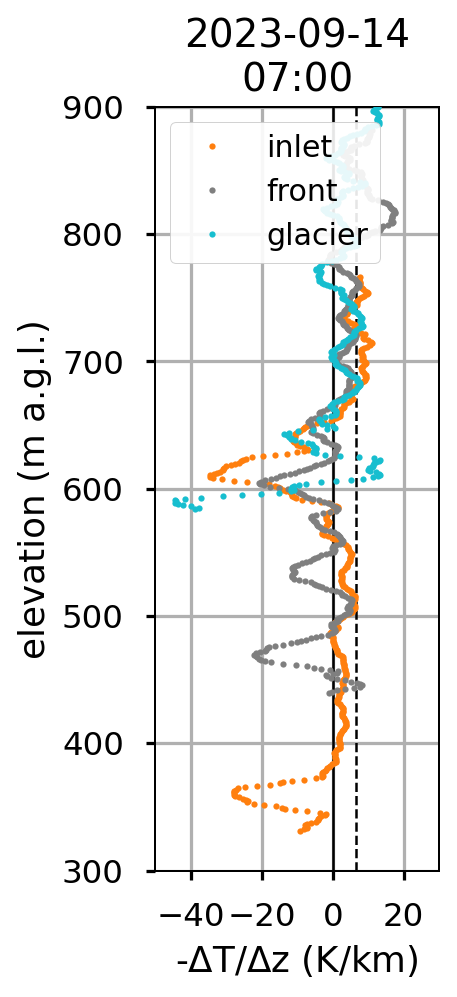

In [389]:
# plot

fig, ax2 = plt.subplots(1, figsize=(3, 6), dpi=180)

#plt.rcParams.update({'font.size': 12})

plt.style.use('seaborn-v0_8-talk')

# plot temperature profiles in right panel
for i in range(len(processed_dfs)):
    label = ''
    if t[:2] == '13' and processed_dfs[i]['dist'][0] < 50:
        label = 'outlet'
        color = c[6]
    elif 50 < processed_dfs[i]['dist'][0] < 1800:
        label = 'lake'
        color = 'y'
    elif 3000 < processed_dfs[i]['dist'][0] < 3700:
        label = 'inlet'
        color = c[1]
    elif 4000 < processed_dfs[i]['dist'][0] < 5100:#4800:
        label = 'front'
        color = c[7]
    elif 5300 < processed_dfs[i]['dist'][0] < 6000:
        label = 'glacier'
        color = c[9]
    if label != '':
        window = 20
        #ax2.plot(processed_dfs[i][var], processed_dfs[i]['z_shifted'], marker='.', ls='-', color=color, lw=1, ms=5, label=label)#imets[df_tmp]['lat'].iloc[0])
        ax2.plot(-1000*(processed_dfs[i][var][1:].reset_index(drop=True)-processed_dfs[i][var][:-1]).rolling(window, center=True).mean()/(processed_dfs[i]['z_shifted'][1:].reset_index(drop=True)-processed_dfs[i]['z_shifted'][:-1]).rolling(window, center=True).mean(), processed_dfs[i]['z_shifted'][:-1].rolling(window, center=True).mean(), marker='.', ls='None', color=color, lw=1, ms=5, label=label, zorder=3)#imets[df_tmp]['lat'].iloc[0])

# add surface observations in right panel
if var == 'tfff':
    ax2.plot(ttNB.loc[ttNB['date_N5_']==date,['t_N5_']], glacier_aws[2]+2.79, c=c[9], marker='o', ls='-', lw=1, ms=1.5*5)
    ax2.plot(ttNB.loc[ttNB['date_N4_']==date,['t_N4_']], glacier_aws[2]+1.79, c=c[9], marker='o', ls='-', lw=1, ms=1.5*5)
    ax2.plot(ttNB.loc[ttNB['date_N3_']==date,['t_N3_']], glacier_aws[2], c=c[9], marker='o', ls='-', lw=1, ms=1.5*5)
    #ax2.plot(ttNB.loc[ttNB['date_N3_']==date,['t_N3_']], glacier_aws[2], c='y', marker='o', ls='-', lw=1, ms=2*5, label='tinytags')
#    ax2.scatter(humilog_upper.loc[humilog_upper['date']>=date,'T'].iloc[0],upper_tongue[2], c='turquoise', s=200, marker='^', zorder=1000)
#    ax2.scatter(humilog_lower.loc[humilog_upper['date']>=date,'T'].iloc[0],lower_tongue[2], c='orange', s=200, marker='^', zorder=1000)
    ax2.scatter(FF.loc[FF['date']>=date,'T'].iloc[0],inlet_aws[2], c=c[1], marker='^', s=150, zorder=1000)
    if t[:2] == '13':
        ax2.scatter(NV.loc[NV['date']>=date,'t'].iloc[0],outlet_aws[2], c=c[6], marker='^', s=150, zorder=1000)

ax2.fill_between([-50, 30], 0, 284, linestyle='-', color='k', zorder=100)
#ax1.fill_between(x_plot, intalts_extended, start_level, linestyle='-', color='k', zorder=10)

ax2.legend(loc=2, fontsize=12, framealpha=.9)
#legend.get_frame().set_alpha(None)
#legend.get_frame().set_facecolor((0, 0, 1, 0.1))
ax2.set_xlabel('-$\Delta$T/$\Delta$z (K/km)')# of vertical profiles') $\u00b0$C
ax2.set_xlim(-50,30)#2,13)
ax2.set_xticks([-40,-20,0,20])
ax2.axvline(0, c='k', lw=1, ls='-',zorder=2)
ax2.axvline(6.5, c='k', lw=1, ls='--',zorder=2)

ax2.set_ylim(300,900)#np.max(zs))
ax2.set_ylabel('elevation (m a.s.l.)')
#ax2.set_yticklabels([])

#ax1.set_title(f'{str(date)[:-3]}')
ax2.set_title(f'{str(date)[:-9]}\n{str(date)[-8:-3]}')

plt.grid(zorder=0)
plt.tight_layout()
#plt.savefig(f'interpolation/kristines_adaption/figures/colorbar2.png')
plt.savefig(f'interpolation/kristines_adaption/figures/{var}_{t[:5]}_dTdz_legend.png')
plt.show()

In [1443]:
xind_inlet
np.arange(ax1.get_xlim()[0]-30-2000,ax1.get_xlim()[0]+1,1000)
#np.arange(ax1.get_xlim()[0]-30-5000,ax1.get_xlim()[0]+1,1000)
dist[-5], xind_inlet
x_plot[-1], xind_glacier

(5619.724893187739, 5619.724893187739)

In [737]:
original_xticklabels, original_xticks
ax1.get_xlim()
original_xlim[::-1]
np.arange(ax1.get_xlim()[-1]-80-5000,ax1.get_xlim()[-1],1000)

#for i in len(processed_dfs):
            
(processed_dfs)#[0], df_selected_sorted_smoothed

color

'#17becf'

In [738]:
df_combined = pd.concat(list(processed_dfs)).reset_index(drop=True)
df_combined = df_combined.dropna().reset_index(drop=True)
interpolator = LinearNDInterpolator(points=df_combined[['dist', 'z_shifted']], values=df_combined[var])

# target grid
#n_dist_grid = (len(intdist)-1)*10 #900
#target_dist_min = 0
#target_dist_max = df_combined['dist'].max()
#target_dist = np.linspace(target_dist_min, target_dist_max, n_dist_grid)
target_dist = interpolate_array(intdist, len(intdist), 10)
n_z_grid = 1000
target_z_min = 250
target_z_max = df_combined['z_shifted'].max()
target_z = np.arange(target_z_min, target_z_max, 1)#n_z_grid)
target_dists, target_zs = np.meshgrid(target_dist, target_z)
interpolated_dist_z = interpolator(target_dists, target_zs)

# add outlet/inlet near surface observation if missing
try:
    imets[t[:5]+'-inl']
except:
    print ('adding inlet observation because inlet profile does not exist')
    interpolated_dist_z = add_obs(interpolated_dist_z, target_dists, target_zs, 'inlet', ndint=True)
else:
    if imets[t[:5]+'-inl']['z'][0] > inlet_aws[2]+10:
        print ('adding inlet observation because profile starts high above surface')
        interpolated_dist_z = add_obs(interpolated_dist_z, target_dists, target_zs, 'inlet', ndint=True)
try:
    imets[t[:5]+'-out']
except:
    try:
        imets[t[:5]+'-outlet']
    except:
        print ('not adding outlet observation')
    else:
        interpolated_dist_z = add_obs(interpolated_dist_z, target_dists, target_zs, 'outlet', ndint=True)
        print ('adding outlet observation because inlet profile does not exist')
else:
    if imets[t[:5]+'-out']['z'][0] > outlet_aws[2]+10:
        print ('adding outlet observation because profile starts high above surface')
        interpolated_dist_z = add_obs(interpolated_dist_z, target_dists, target_zs, 'outlet', ndint=True)

adding inlet observation because profile starts high above surface
200 27
old value: nan
new value: 10.39
adding outlet observation because profile starts high above surface
10 26
old value: nan
new value: 10.23


In [739]:
# shift columns up to surface line if more than 2 meters below
s = np.where(target_dist==xind_outlet)[0][0]
for i in range(s,np.shape(interpolated_dist_z)[1]-1):
    j = np.where(~np.isnan(interpolated_dist_z[:,i]))[0][0]
    if abs(intalts_extended[i] - target_zs[j,i]) > 2:
        z_shift = int(intalts_extended[i] - target_zs[j,i])
        if z_shift > 0:
            #print (f'shifting columns up by {z_shift} meters')
            interpolated_dist_z[j+z_shift:,i] = interpolated_dist_z[j:-z_shift,i]
            interpolated_dist_z[j:j+z_shift,i] = np.nan
        #else:
            #print (f'not shifting columns down by {z_shift} meters')
            #print (f'shifting columns down by {z_shift} meters')
            #interpolated_dist_z[j+z_shift:z_shift,i] = interpolated_dist_z[j:,i]
            #interpolated_dist_z[z_shift:,i] = np.nan

In [740]:
# TO DO:
# check xyspacenew - isn't interpolation done for surface points?
# add humilog before 2nd interpolation?
# add lake temp? probably not... 3.5-3.8 degC during campaign (round up to 4)
# update intalts for new interpolation space
# by interpolation (practical option), or using DEM (best option)
# shift each column in interpolated_dist_z to correct surface altitude (not if profiles start above surface)

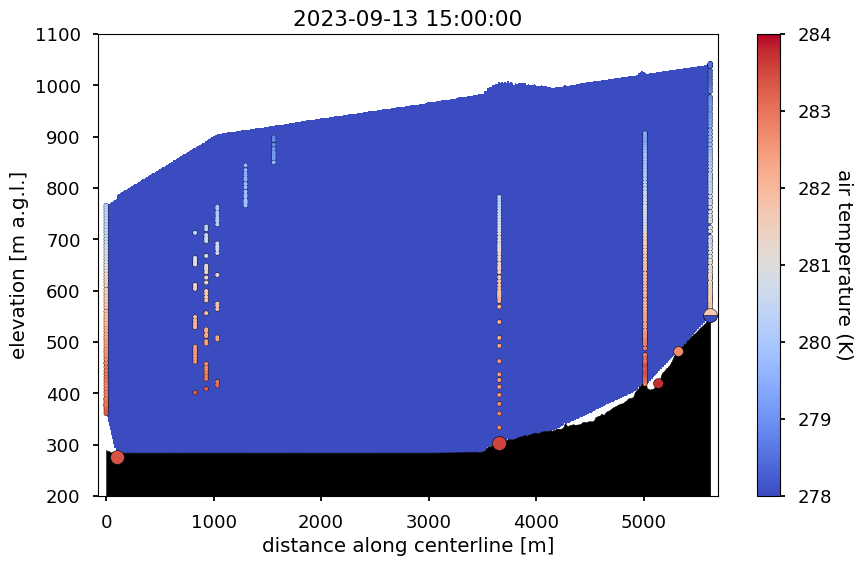

In [741]:


plt.style.use('seaborn-v0_8-talk')
fig, ax = plt.subplots(figsize=(10,6))

#zoom = 2
#w, h = fig.get_size_inches()
#fig.set_size_inches(w * zoom, h * zoom)

contour_plot = plt.pcolormesh(target_dists, target_zs, interpolated_dist_z, cmap=cmap, norm=norm)#, levels=15)
#plt.scatter(df_combined['dist'],df_combined['z_shifted'],s=1,marker='.')
#plt.plot(intdist, intalts, 0, linestyle='-', color='k')
plt.fill_between(target_dist, intalts_extended, 0, linestyle='-', color='k')

cb = plt.colorbar(mappable, ax=ax)#, ticks=np.arange(vmin, vmax))
cb.set_label(cblab, rotation=270, labelpad=15)

#nearest_index = np.argmin([np.abs(i-xind_front) for i in intdist])
#yind_front = intalts[nearest_index] # 381?
# Draw the line if yind_front is not NaN
#plt.vlines(x=xind_outlet, ymin=0, ymax=285, color='royalblue', linestyle='--')  # Replace with the actual y-coordinate
#text_offset = 30
#plt.text(xind_front + text_offset, 25, 'front', color='w', verticalalignment='bottom', horizontalalignment='left', rotation=90)

ax = add_observations(ax)
#plt.axhline(540,color='k')

plt.ylim(200,1100)
plt.xlabel('distance along centerline [m]')
plt.ylabel('elevation [m a.s.l.]')
plt.title(f'{date}')
xoffset = 70
plt.xlim([plt.gca().get_xlim()[0]-xoffset, plt.gca().get_xlim()[1]+xoffset])#plt.gca().get_xlim())
plt.savefig(f'interpolation/kristines_adaption/figures/{var}_{t[:5]}.png')
plt.show()

### plot vertical profiles

In [ ]:
uav_wind[u]['Profile ID'].str[:1][0]

In [ ]:
#for u in uav_wind:
#    if uav_wind[u]['Profile ID'].str[0][0] == '1':# and u[-2:] == 'Ds':
#        print (uav_wind[u]['Profile ID'].str[:1])

In [ ]:
cm 

14-inlet
UAV observations between 2023-09-14 14:00:00 and 2023-09-14 16:00:00
14-acier
UAV observations between 2023-09-14 14:00:00 and 2023-09-14 16:00:00
14-front
UAV observations between 2023-09-14 14:00:00 and 2023-09-14 16:00:00


/tmp/ipykernel_12494/838626750.py:22: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



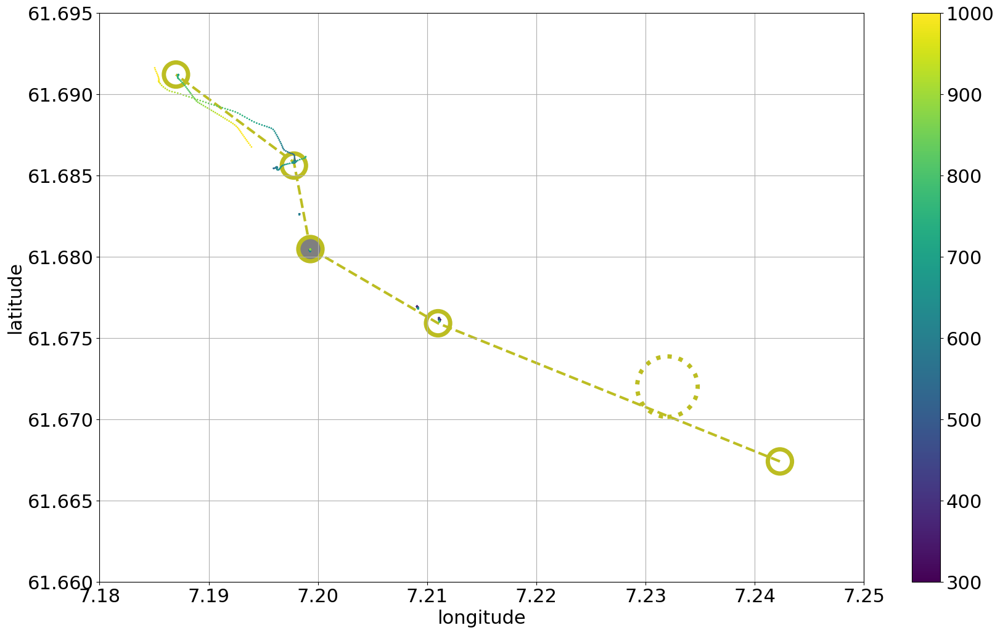

In [65]:

xmin=7.119312#7.084122#7.1
xmax=7.282047#7.3
ymin=61.656313#61.6
ymax=61.705824#61.705987#61.75

xmin=7.18#111416
xmax=7.25#30299
ymin=61.66#650282
ymax=61.695#705824

txmin = 5.725385
txmax = 8.298279
tymin = 61.01281
tymax = 62.07157

#proj = ccrs.epsg(25833)#3857)#9001)#

#norm = 60
fig,ax = plt.subplots(1,figsize=(20,12))#706/norm,569/norm))


cmap = cm.get_cmap('viridis', 10)

#plt.contourf(terrain, extent=[txmin,txmax,tymax,tymin], cmap='terrain')
#plt.contour(terrain, extent=[txmin,txmax,tymax,tymin], levels=np.arange(0,2000,100), colors='k', projection = ccrs.PlateCarree, transform=proj)

#norm = colors.BoundaryNorm(np.arange(.05, .36, .05), cmap.N)
#start = 0
#end = len(time_gps)-1
alp = 1
s1 = 600
s2 = 100
s3 = 100
s4 = 800
m = '^'
m2 = 's'
m3 = 'o'
m4 = 'o'
lw = 5
ec = 'k'#None

#cm = ax.scatter((lon[start:end]), (lat[start:end]), c=(albedo[start:end]), s=30, cmap=cmap, norm=norm)
#fig.colorbar(cm, ax=ax)#, aspect=40)

start = datetime(2023, 9, 14, 6, 0, 0)
end   = datetime(2023, 9, 14, 8, 0, 0)
delay = 0

uav_base = True
if uav_base == True:
    ax.plot([7.2423,7.2110,7.1993,7.1978,7.1870], [61.6674,61.6759,61.6805,61.6858,61.6912], c=c[8], ls='--', lw=3, zorder=0)
    ax.scatter(7.2423, 61.6674, alpha=alp, ec=c[8], fc='none', lw=lw, marker=m4, s=s4, zorder=1)
    ax.scatter(7.2110, 61.6759, alpha=alp, ec=c[8], fc='none', lw=lw, marker=m4, s=s4, zorder=1)
    ax.scatter(7.1993, 61.6805, alpha=alp, ec=c[8], fc=c[7],   lw=lw, marker=m4, s=s4, zorder=1)
    ax.scatter(7.1978, 61.6856, alpha=alp, ec=c[8], fc='none', lw=lw, marker=m4, s=s4, zorder=1)
    ax.scatter(7.1870, 61.6912, alpha=alp, ec=c[8], fc='none', lw=lw, marker=m4, s=s4, zorder=1)
    ax.scatter(7.232, 61.672, alpha=alp, ec=c[8], fc='none', lw=lw, ls=':', marker=m4, s=5000, zorder=1)
    ax.scatter((),(), alpha=alp, ec='None', fc=c[7], marker=m4, s=s4-200, label='Radiosonde')
    ax.scatter((),(), alpha=alp, ec=c[8], fc='none', lw=lw, marker=m4, s=s4, label='UAV')
    ax.scatter((),(), alpha=alp, ec=c[8], fc='none', lw=lw, ls=':', marker=m4, s=600, zorder=1, label='Paraglider') # (part of flight below 1000 m)
    

ax.plot([7.19252,7.21154],[61.703,61.703],'k')
ax.plot([7.19252,7.19252],[61.703,61.7045],'k')
ax.plot([7.21154,7.21154],[61.703,61.7045],'k')
    
uav = True
if uav == True:
    for delay in [8]:#[0,2,5,8,11]:
        for imet in imets:
            if (imets[imet].reset_index()['date'][0] > start)&(imets[imet].reset_index()['date'][0] < end):
                #print (imets[imet].reset_index()['date'][0])
                print (imet)#imets[imet].reset_index()['date'][0])
                imet = imets[imet].loc[(imets[imet]['date'] >= start+pd.Timedelta(hours=delay))&
                                       (imets[imet]['date'] <= end+pd.Timedelta(hours=delay))]
                print (f'UAV observations between {start+pd.Timedelta(hours=delay)} and {end+pd.Timedelta(hours=delay)}')
                #ax.scatter(imets[imet]['Longitude'],imets[imet]['Latitude'],
                upl = ax.scatter(imet['Longitude'],imet['Latitude'],
                           s=1,
                           vmin=300,vmax=1000,
                           c = imet['Altitude'])#imet['Air Temperature'], cmap='viridis')
                            #c='grey',alpha=.5)
    ax.plot((),(),c='y',label='UAV')
    plt.colorbar(upl)

#ax.set_title(f'')
ax.set_xlabel('longitude')
ax.set_ylabel('latitude')
ax.set_xlim(xmin,xmax)
ax.set_ylim(ymin,ymax)
plt.grid()
plt.show()

In [ ]:
norm = plt.Normalize(10,15)

fig, (ax1) = plt.subplots(1,figsize=(15,15))
for imet in imets:
    p = ax1.scatter(imets[imet]['Air Temperature'],imets[imet]['Altitude'],s=3)#,norm=norm)#, label='UAV/iMet')  #-np.min(imet['Altitude'])
ax1.scatter(tt['temperature'],tt['altitude'])
        
#ax1.set_xlim([start, end])
#ax1.xaxis.set_major_formatter(DateFormatter('%H:%M'))
ax1.set_xlabel('temperature (\u00b0C)')
ax1.set_ylabel('altitude (m a.s.l.)')
#ax1.legend()
#cbar = plt.colorbar(p, orientation='horizontal', pad=.07, aspect=50)
#cbar.set_label('temperature (\u00b0C)')
plt.grid()
plt.show()

13-lider
13-front
14-inlet
14-inlet
lat:  61.6760095
lon:  7.2111387
12-acier
12-front
12-inlet
12-utlet
13-inlet
13-utlet
13-acier
14-acier
14-acier
lat:  61.6859052
lon:  7.1979915
14-front
14-front
lat:  61.6803932
lon:  7.199199


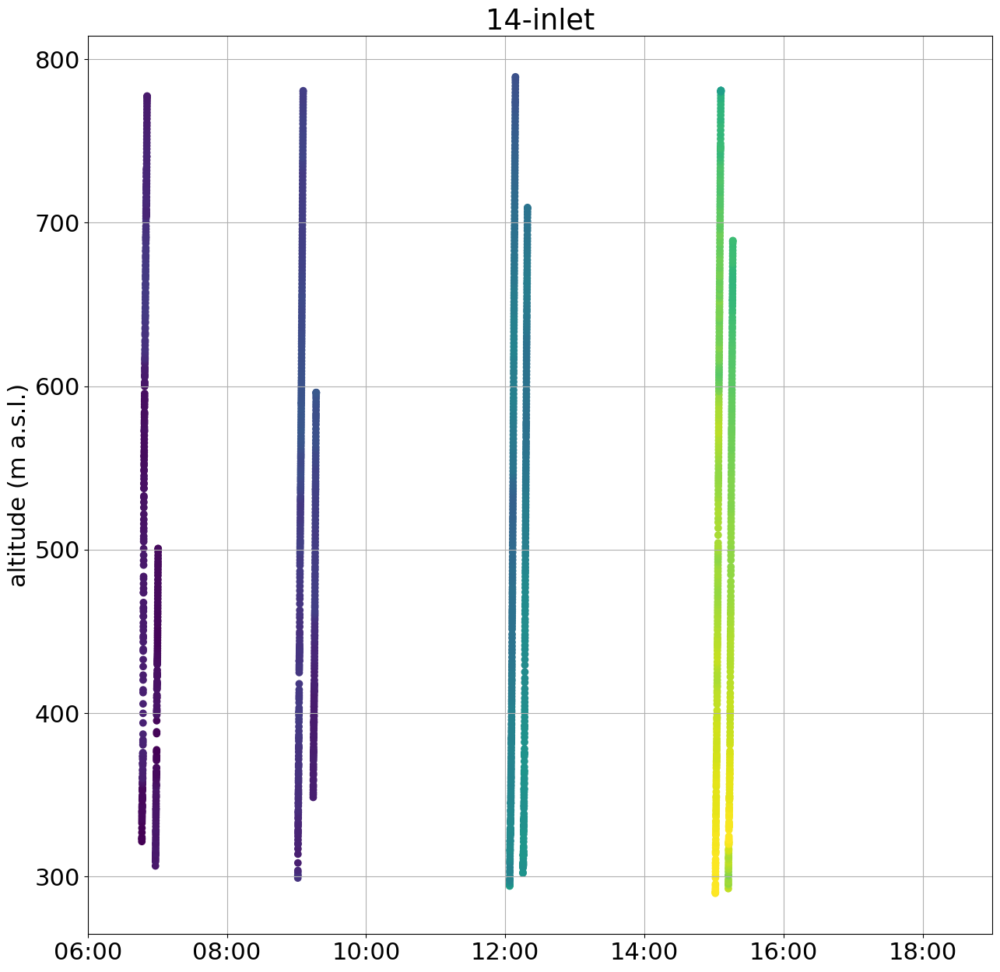

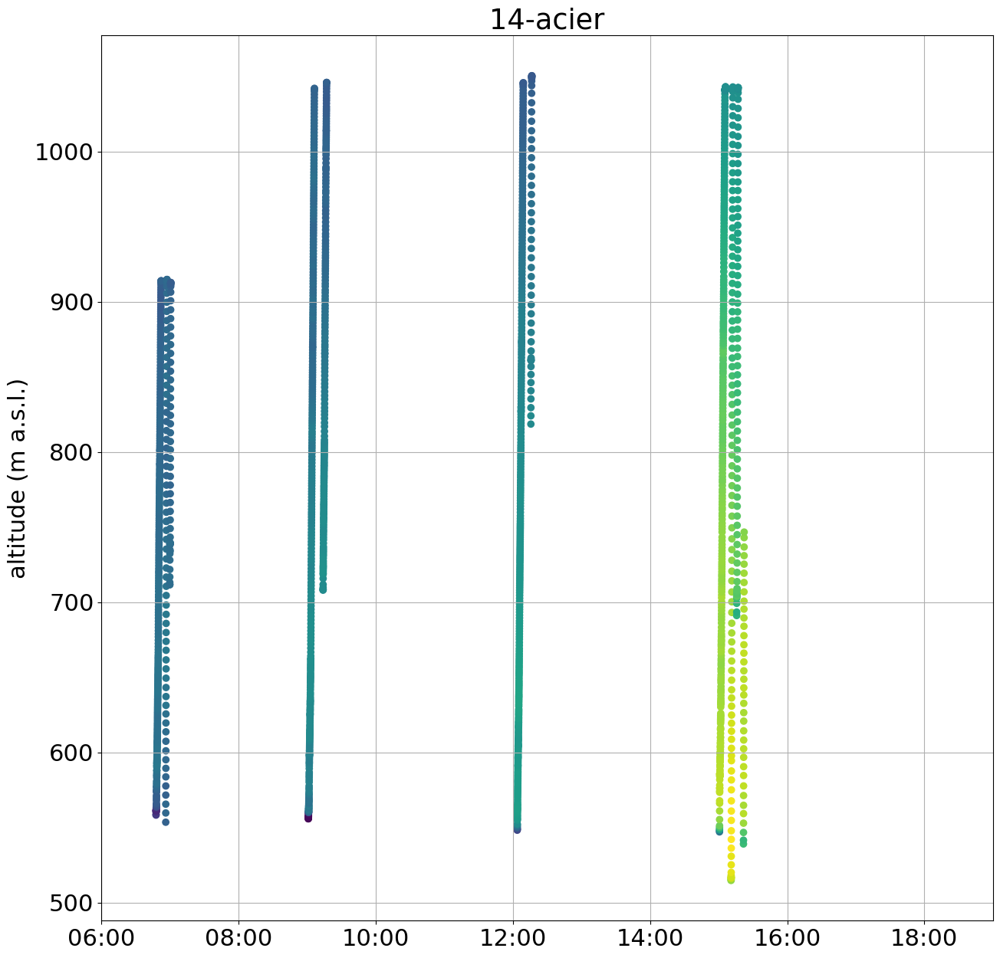

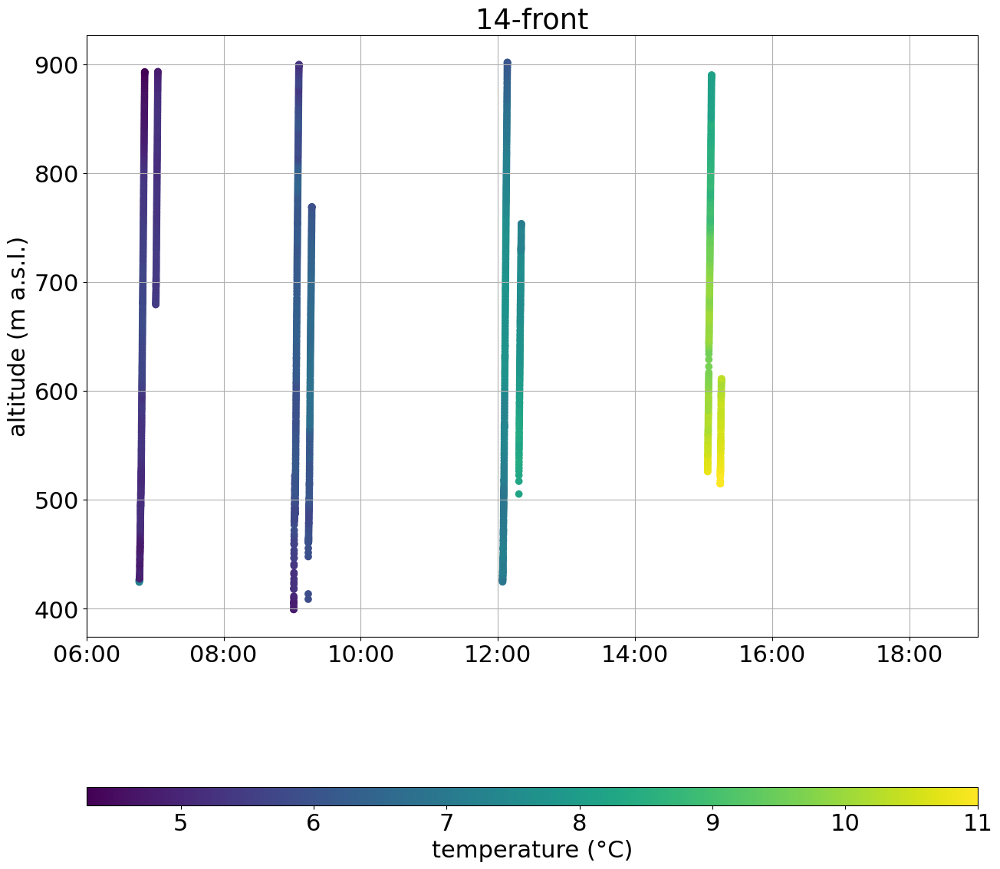

In [66]:
norm = plt.Normalize(10,15)

start = datetime(2023, 9, 14, 6, 0, 0)
end   = datetime(2023, 9, 14, 19, 0, 0)


for imet in imets:
    print (imet)
    if (imets[imet].reset_index()['date'][0] > start)&(imets[imet].reset_index()['date'][0] < end):
        fig, (ax1) = plt.subplots(1,figsize=(15,15))
        #ax1.scatter(tt['date']+pd.DateOffset(minutes=2),tt['altitude'],c=tt['temperature'],
        #            cmap='viridis')
        p = ax1.scatter(imets[imet]['date'],imets[imet]['Altitude'],#+pd.DateOffset(hours=2)
                        c=imets[imet]['Air Temperature'],
                        cmap='viridis')#,norm=norm)#, label='UAV/iMet')  #-np.min(imet['Altitude'])
        #ax1.scatter(imet['Air Temperature'], (imet['Altitude']-np.min(imet['Altitude'])),c='k', label='UAV/iMet')
        #for i,n in enumerate(['N1','N2','N3','N4','N5','N6','N7']):#['tt9','tt12','tt4','tt14']):
        #    if n=='tt4':
        #        ax1.axvline(datetime(2023, 9, 1, 14, 37, 30),c=col[i])
        #        ax1.text(datetime(2023, 9, 1, 14, 37, 30), 800, lab[i],  ha='right', va='bottom', rotation='vertical',c=col[i])
        #ax1.axvline(datetime(2023, 9, 5, 13, 12, 0), c='k', ls='--')
        ax1.set_title(imet)    
        print (imet)    
        print ('lat: ', imets[imet].reset_index()['Latitude'][0])
        print ('lon: ', imets[imet].reset_index()['Longitude'][0])        
        ax1.set_xlim([start, end])
        plt.grid()
        ax1.xaxis.set_major_formatter(DateFormatter('%H:%M'))#%d/%m %H:%M'))#
        #ax1.tick_params(axis="x", rotation=40) 
        #ax1.set_xlabel('time')
        ax1.set_ylabel('altitude (m a.s.l.)')
        #ax1.axvline(datetime(2023, 9, 14, 12, 15, 0))
        #ax1.axvline(datetime(2023, 9, 14, 9, 0, 0))
#ax1.legend()
cbar = plt.colorbar(p, orientation='horizontal', pad=.17, aspect=50)
cbar.set_label('temperature (\u00b0C)')
plt.show()

In [ ]:
# manual removal of invalid imet data

start_times = [datetime(2023, 9, 12, 0, 0, 0), datetime(2023, 9, 12, 14, 30, 0), datetime(2023, 9, 12, 17, 0, 0),datetime(2023, 9, 14, 11, 0, 0)]
end_times   = [datetime(2023, 9, 12, 13, 10, 0), datetime(2023, 9, 12, 15, 30, 0), datetime(2023, 9, 12, 18, 0, 0),datetime(2023, 9, 14, 12, 0, 0)]

for s,e in zip(start_times, end_times):
    for imet in imets:
        #imet = imets[imet]
        imets[imet] = imets[imet].loc[(imets[imet]['date'] < s) | (imets[imet]['date'] > e)]
    
imet = '12-65805'
start_times = [datetime(2023, 9, 12, 13,  0, 0),datetime(2023, 9, 12, 13, 48, 0)]
end_times   = [datetime(2023, 9, 12, 13, 30, 0),datetime(2023, 9, 12, 13, 49, 0)]
for s,e in zip(start_times, end_times):
    imets[imet] = imets[imet].loc[(imets[imet]['date'] < s) | (imets[imet]['date'] > e)]

imet = '12-61169'
start_times = [datetime(2023, 9, 12, 13, 33, 0),datetime(2023, 9, 12, 13, 31, 0)]
end_times   = [datetime(2023, 9, 12, 13, 35, 0),datetime(2023, 9, 12, 13, 38, 0)]
for s,e in zip(start_times, end_times):
    imets[imet] = imets[imet].loc[(imets[imet]['date'] < s) | (imets[imet]['date'] > e)]
        
imet = '12-61143'
start_times = [datetime(2023, 9, 12, 13, 34, 0)]
end_times   = [datetime(2023, 9, 12, 14,  0, 0)]
for s,e in zip(start_times, end_times):
    imets[imet] = imets[imet].loc[(imets[imet]['date'] < s) | (imets[imet]['date'] > e)]

imet = '13-65805'
start_times = [datetime(2023, 9, 13, 15, 30, 0)]
end_times   = [datetime(2023, 9, 13, 17, 10, 0)]
for s,e in zip(start_times, end_times):
    imets[imet] = imets[imet].loc[(imets[imet]['date'] < s) | (imets[imet]['date'] > e)]
    
imet = '13-61169'
start_times = [datetime(2023, 9, 13, 6, 20, 0),datetime(2023, 9, 13, 12, 15, 0)]
end_times   = [datetime(2023, 9, 13, 6, 43, 0),datetime(2023, 9, 13, 12, 20, 0)]
for s,e in zip(start_times, end_times):
    imets[imet] = imets[imet].loc[(imets[imet]['date'] < s) | (imets[imet]['date'] > e)]

imet = '13-61143'
start_times = [datetime(2023, 9, 13, 6, 0, 0)]
end_times   = [datetime(2023, 9, 13, 9, 0, 0)]
for s,e in zip(start_times, end_times):
    imets[imet] = imets[imet].loc[(imets[imet]['date'] < s) | (imets[imet]['date'] > e)]

imet = '14-61143'
start_times = [datetime(2023, 9, 14, 12, 16, 0)]
end_times   = [datetime(2023, 9, 14, 12, 18, 20)]
for s,e in zip(start_times, end_times):
    imets[imet] = imets[imet].loc[(imets[imet]['date'] < s) | (imets[imet]['date'] > e)]

imet = '14-65805'
start_times = [datetime(2023, 9, 14, 8, 0, 0),datetime(2023, 9, 14, 14, 30, 0)]
end_times   = [datetime(2023, 9, 14, 9, 1, 0),datetime(2023, 9, 14, 15, 0, 0)]
for s,e in zip(start_times, end_times):
    imets[imet] = imets[imet].loc[(imets[imet]['date'] < s) | (imets[imet]['date'] > e)]
   
    

In [ ]:
norm = plt.Normalize(10,15)

start = datetime(2023, 9, 14, 6, 0, 0)
end   = datetime(2023, 9, 14, 8, 0, 0)
delay = 5


#ax1.scatter(tt['date']+pd.DateOffset(minutes=2),tt['altitude'],c=tt['temperature'],
#                cmap='viridis')
for delay in [5]:#,2,5,8]:#,11]:
    fig, (ax1) = plt.subplots(1,figsize=(15,15))
    for i,imet in enumerate(imets):
        print (i,imet)
        #if imet == '13-61169':
        #print (imet)
        if (imets[imet].reset_index()['date'][0] > start)&(imets[imet].reset_index()['date'][0] < end):
            #print (imets[imet].reset_index()['date'][0])
            imet = imets[imet].loc[(imets[imet]['date'] >= start+pd.Timedelta(hours=delay))&
                                   (imets[imet]['date'] <= end+pd.Timedelta(hours=delay))]
            p = ax1.scatter(imet['Longitude'],imet['Altitude'],
                            s=[70,20,70,40,20,70,40,20,70,40,20][i],#np.arange(90,0,-10)[i],#[50,45,
                            c=c[i],#imet['Air Temperature'],#
                            #vmin=4, vmax=15,
                            cmap='viridis')#,norm=norm)#, label='UAV/iMet')  #-np.min(imet['Altitude'])
            time = (imet.reset_index()['date'][0])#+pd.Timedelta(hours=1))
            print (time)
    ax1.axvline(7.187,c='k',zorder=0)
    ax1.axvline(7.1978,c='k',zorder=0)
    ax1.axvline(7.1993,c='k',zorder=0)
    ax1.axvline(7.2110,c='k',zorder=0)
    ax1.axvline(7.2423,c='k',zorder=0)
    ax1.set_title(f"start time around {time}")
    ax1.set_xlabel('longitude (\u00b0N)')
    ax1.set_ylabel('altitude (m a.s.l.)')
    cbar = plt.colorbar(p, orientation='horizontal', pad=.17, aspect=50)
    cbar.set_label('temperature (\u00b0C)')
    plt.grid()
plt.show()

In [ ]:
norm = plt.Normalize(10,15)

start = datetime(2023, 9, 14, 6, 0, 0)
end   = datetime(2023, 9, 14, 8, 0, 0)
delay = 5


#ax1.scatter(tt['date']+pd.DateOffset(minutes=2),tt['altitude'],c=tt['temperature'],
#                cmap='viridis')
for delay in [5]:#0,2,5,8]:#,11]:
    fig, (ax1) = plt.subplots(1,figsize=(15,15))
    for imet in imets:
        print (imet)
        if (imets[imet].reset_index()['date'][0] > start)&(imets[imet].reset_index()['date'][0] < end) or (imet=='15-65717'):
            #print (imets[imet].reset_index()['date'][0])
            #print (imets[imet])
            imet = imets[imet].loc[(imets[imet]['date'] >= start+pd.Timedelta(hours=delay))&
                                   (imets[imet]['date'] <= end+pd.Timedelta(hours=delay))]
            p = ax1.scatter(imet['Latitude'],imet['Altitude'],
                            c=imet['Air Temperature'],
                            #vmin=4, vmax=15,
                            cmap='viridis')#,norm=norm)#, label='UAV/iMet')  #-np.min(imet['Altitude'])
            #time = (imet.reset_index()['date'][0])#+pd.Timedelta(hours=1))
            #print (imet)
            #print (time)
    ax1.axvline(61.6674,c='k',zorder=0)
    ax1.axvline(61.6759,c='k',zorder=0)
    ax1.axvline(61.6805,c='k',zorder=0)
    ax1.axvline(61.6856,c='k',zorder=0)
    ax1.axvline(61.6912,c='k',zorder=0)
    
    ax1.set_xlim(61.66,61.693)
    ax1.set_ylim(250,1400)
    ax1.set_title(f"")#start time around {time}")
    ax1.set_xlabel('latitude (\u00b0N)')
    ax1.set_ylabel('altitude (m a.s.l.)')
    cbar = plt.colorbar(p, orientation='horizontal', pad=.17, aspect=50)
    cbar.set_label('temperature (\u00b0C)')
    plt.grid()
plt.show()

In [ ]:
norm = plt.Normalize(10,15)

start = datetime(2023, 9, 12, 12, 0, 0)
end   = datetime(2023, 9, 14, 20, 0, 0)
delay = 5


#ax1.scatter(tt['date']+pd.DateOffset(minutes=2),tt['altitude'],c=tt['temperature'],
#                cmap='viridis')
for delay in [0]:#0,2,5,8]:#,11]:
    fig, (ax1) = plt.subplots(1,figsize=(15,15))
    for imet in imets:
        print (imet)
        if (imets[imet].reset_index()['date'][0] > start)&(imets[imet].reset_index()['date'][0] < end) or (imet=='15-65717'):
            #print (imets[imet].reset_index()['date'][0])
            #print (imets[imet])
            imet = imets[imet].loc[(imets[imet]['date'] >= start+pd.Timedelta(hours=delay))&
                                   (imets[imet]['date'] <= end+pd.Timedelta(hours=delay))]
            p = ax1.scatter(imet['date'],imet['Latitude'],
                            c=imet['Air Temperature'],
                            #vmin=4, vmax=15,
                            cmap='viridis')#,norm=norm)#, label='UAV/iMet')  #-np.min(imet['Altitude'])
            time = (imet.reset_index()['date'][0])#+pd.Timedelta(hours=1))
            #print (imet)
            #print (time)
    ax1.axvline(61.6674,c='k',zorder=0)
    ax1.axvline(61.6759,c='k',zorder=0)
    ax1.axvline(61.6805,c='k',zorder=0)
    ax1.axvline(61.6856,c='k',zorder=0)
    ax1.axvline(61.6912,c='k',zorder=0)
    
    ax1.set_xlim([start, end])
    ax1.set_xlabel('local time')
    ax1.xaxis.set_major_formatter(DateFormatter('%H:%M'))#%d/%m %H:%M'))#
    #ax1.set_xlim(61.66,61.693)
    #ax1.set_ylim(250,1400)
    ax1.set_title(f"")#start time around {time}")
    ax1.set_ylabel('latitude (\u00b0N)')
    ax1.set_xlabel('')
    cbar = plt.colorbar(p, orientation='horizontal', pad=.17, aspect=50)
    cbar.set_label('temperature (\u00b0C)')
plt.grid()
plt.show()

#### october

In [ ]:
norm = plt.Normalize(10,15)

start = datetime(2023, 10, 18, 13, 29, 0)
start = datetime(2023, 10, 18, 13, 25, 0)
end   = datetime(2023, 10, 18, 13, 33, 5)
end   = datetime(2023, 10, 18, 13, 27, 15)
delay = 5


#ax1.scatter(tt['date']+pd.DateOffset(minutes=2),tt['altitude'],c=tt['temperature'],
#                cmap='viridis')
for delay in [0]:#,2,5,8]:#,11]:
    fig, (ax1) = plt.subplots(1,figsize=(15,15))
    imet = imet_oct
    imet = imet_oct.loc[(imet_oct['date'] >= start+pd.Timedelta(hours=delay))&
                        (imet_oct['date'] <= end+pd.Timedelta(hours=delay))]
    p = ax1.scatter(imet['Longitude'],imet['Altitude'],
                    c=imet['Air Temperature'],
                    #vmin=4, vmax=15,
                    cmap='viridis')#,norm=norm)#, label='UAV/iMet')  #-np.min(imet['Altitude'])
    time = (imet.reset_index()['date'][0])#+pd.Timedelta(hours=1))
#    ax1.axvline(7.187,c='k',zorder=0)
#    ax1.axvline(7.1978,c='k',zorder=0)
#    ax1.axvline(7.1993,c='k',zorder=0)
#    ax1.axvline(7.2110,c='k',zorder=0)
#    ax1.axvline(7.2423,c='k',zorder=0)
    ax1.set_title(f"start time around {time}")
    ax1.set_xlabel('longitude (\u00b0N)')
    ax1.set_ylabel('altitude (m a.s.l.)')
    cbar = plt.colorbar(p, orientation='horizontal', pad=.17, aspect=50)
    cbar.set_label('temperature (\u00b0C)')
    plt.grid()
plt.show()

### uav wind

In [ ]:
norm = plt.Normalize(10,15)

start = datetime(2023, 9, 14, 14, 0, 0)
end   = datetime(2023, 9, 14, 16, 0, 0)
#delay = 5


#ax1.scatter(tt['date']+pd.DateOffset(minutes=2),tt['altitude'],c=tt['temperature'],
#                cmap='viridis')
#for delay in [0,2,5,8]:#,11]:
#    start = 
fig, (ax1) = plt.subplots(1,figsize=(15,15))
for uav in uav_wind:
    if (uav[-1:] == 'm') or (uav[-1:] == 'u'):
        if (uav_wind[uav].reset_index()['date'][0] > start)&(uav_wind[uav].reset_index()['date'][0] < end): # using main profiles
            print (uav)
            ax1.set_title(f"{uav[:2]} September around {uav[3:5]}:00")
            uav = uav_wind[uav]
            p = ax1.scatter(uav['Latitude'],uav['Altitude'],
                            c=uav['Wind Direction'],
                            vmin=0, vmax=360,
                            #levels=np.arange(0,361,90),
                            cmap='hsv')#,norm=norm)#, label='UAV/iMet')  #-np.min(imet['Altitude'])
            #time = (imet.reset_index()['date'][0])#+pd.Timedelta(hours=1))
            #print (imet)
            #print (time)
ax1.axvline(61.6674,c='k',zorder=0)
ax1.axvline(61.6759,c='k',zorder=0)
ax1.axvline(61.6805,c='k',zorder=0)
ax1.axvline(61.6856,c='k',zorder=0)
ax1.axvline(61.6912,c='k',zorder=0)

ax1.set_xlim(61.66,61.693)
#ax1.set_ylim(250,1400)
ax1.set_xlabel('latitude (\u00b0N)')
ax1.set_ylabel('altitude (m a.s.l.)')
cbar = plt.colorbar(p, orientation='horizontal', pad=.17, aspect=50)
cbar.set_label('wind direction (\u00b0)')
cbar.set_ticks(np.arange(0,361,90))
plt.grid()
plt.show()

In [ ]:
norm = plt.Normalize(10,15)

start = datetime(2023, 9, 14, 14, 0, 0)
end   = datetime(2023, 9, 14, 16, 0, 0)
#delay = 5


#ax1.scatter(tt['date']+pd.DateOffset(minutes=2),tt['altitude'],c=tt['temperature'],
#                cmap='viridis')
#for delay in [0,2,5,8]:#,11]:
#    start = 
fig, (ax1) = plt.subplots(1,figsize=(10,15))
for uav in uav_wind:
    if (uav[-1:] == 'm') or (uav[-1:] == 'u'):
        if (uav_wind[uav].reset_index()['date'][0] > start)&(uav_wind[uav].reset_index()['date'][0] < end): # using main profiles
            print (uav)
            
            col = c[0]
            if uav[-2:] == 'Dm':
                col = c[9]
            if uav[-2:] == 'Cm':
                col = c[7]
            if uav[-2:] == 'Bm':
                col = c[1]
            if uav[-2:] == 'Am':
                col = c[6]
                
            ax1.set_title(f"{uav[:2]} September around {uav[3:5]}:00")
            uav = uav_wind[uav]
                
            u = uav['Wind Speed']*-1*np.sin((np.pi/180)*(uav['Wind Direction']))
            v = uav['Wind Speed']*-1*np.cos((np.pi/180)*(uav['Wind Direction']))
            
            p = ax1.barbs(uav['Latitude'],uav['Altitude'],
                          u*1.94384, v*1.94384, # convertion to knots for right barbs
                          length=6, barbcolor=[col])
                            #c=uav['Wind Direction']
            #time = (imet.reset_index()['date'][0])#+pd.Timedelta(hours=1))
            #print (imet)
            #print (time)
#ax1.axvline(61.6674,c='k',zorder=0)
#ax1.axvline(61.6759,c='k',zorder=0)
ax1.text(61.6674,1070,'outlet',c=c[6],ha='center')
ax1.text(61.6759,1070,'inlet',c=c[1],ha='center')
ax1.text(61.6805,1070,'front',c=c[7],ha='center')#,rotation=90)#'vertical')
ax1.text(61.6856,1070,'lower',c=c[9],ha='center')
ax1.text(61.6856,1050,'glacier',c=c[9],ha='center')
ax1.text(61.6912,1070,'mid  ',c=c[0],ha='center')
ax1.text(61.6912,1050,'glacier  ',c=c[0],ha='center')
#ax1.axvline(61.6856,c='k',zorder=0)
#ax1.axvline(61.6912,c='k',zorder=0)

ax1.set_xlim(61.66,61.693)
ax1.set_ylim(290,1090)
ax1.set_xlabel('latitude (\u00b0N)')
ax1.set_ylabel('altitude (m a.s.l.)')
#cbar = plt.colorbar(p, orientation='horizontal', pad=.17, aspect=50)
#cbar.set_label('wind direction (\u00b0)')
#cbar.set_ticks(np.arange(0,361,90))
#plt.grid()
plt.show()

### LiDAR

In [ ]:
start = datetime(2023, 9, 14, 4, 0, 0)
end   = datetime(2023, 9, 14, 20, 0, 0)

h_lidar = 284

t,h = (np.meshgrid(lidar['time'],lidar['height']))
fig, (ax1,ax2,ax3) = plt.subplots(3,figsize=(15,40))
p1 = ax1.pcolormesh(t,h+h_lidar,lidar_ws,
               vmin=0,vmax=20)
ax1.set_xlim(start,end)
ax1.set_xlabel('local time')
ax1.xaxis.set_major_formatter(DateFormatter('%H:%M'))
cbar = plt.colorbar(p1, ax=ax1, orientation='horizontal', pad=.07, aspect=50)
cbar.set_label('horisontal wind speed (m/s)')
ax1.set_ylabel('altitude (m a.s.l.)')

p2 = ax2.pcolormesh(t,h+h_lidar,(lidar['w'].T),
                 vmin=-5,vmax=5,
                 cmap='bwr')
ax2.set_xlim(start,end)
ax2.set_xlabel('local time')
ax2.xaxis.set_major_formatter(DateFormatter('%H:%M'))
cbar = plt.colorbar(p2, ax=ax2, orientation='horizontal', pad=.07, aspect=50)
cbar.set_label('vertical wind speed (m/s)')
ax2.set_ylabel('altitude (m a.s.l.)')

p3 = ax3.pcolormesh(t,h+h_lidar,lidar_wd,
                vmin=0,vmax=360,
                   cmap='hsv')
ax3.set_xlim(start,end)
ax3.set_xlabel('local time')
ax3.xaxis.set_major_formatter(DateFormatter('%H:%M'))
cbar = plt.colorbar(p3, ax=ax3, orientation='horizontal', pad=.07, aspect=50)
cbar.set_label('wind direction (\u00b0)')
cbar.set_ticks(np.arange(0,361,90))
ax3.set_ylabel('altitude (m a.s.l.)')

plt.tight_layout()
plt.show()

In [ ]:
start = datetime(2023, 9, 12, 4, 0, 0)
end   = datetime(2023, 9, 12, 20, 0, 0)

h_lidar = 284

t,h = (np.meshgrid(lidar['time'],lidar['height']))
fig, (ax1) = plt.subplots(1,figsize=(15,15))
i = 2

p1 = ax1.pcolormesh(t,h+h_lidar,lidar_ws,
               vmin=0,vmax=20)
ax1.barbs(t[::i,::i],h[::i,::i]+h_lidar,
               lidar['u'].T[::i,::i],lidar['v'].T[::i,::i],
#               lidar_ws[::i,::i],
#               cmap='viridis',
               #barbcolor=[lidar_ws],
               length=7)
               #vmin=0,vmax=20)

ax1.set_xlim(start,end)
ax1.set_xlabel('local time')
ax1.xaxis.set_major_formatter(DateFormatter('%H:%M'))
cbar = plt.colorbar(p1, ax=ax1, orientation='horizontal', pad=.07, aspect=50)
cbar.set_label('horisontal wind speed (m/s)')
ax1.set_ylabel('altitude (m a.s.l.)')


plt.tight_layout()
plt.show()

### plot temperature map

In [ ]:
im = plt.imread('map/2022-08-31-00_00_2022-08-31-23_59_Sentinel-2_L1C_True_color_heatmap.png')#2023-08-31-00_00_2023-08-31-23_59_Sentinel-2_L1C_True_color.png')

xmin=7.182312
xmax=7.290974
ymin=61.650282
ymax=61.695977

#norm = 60

cmap = cm.get_cmap('bwr', 10)#'viridis'
#norm = colors.BoundaryNorm(np.arange(.05, .36, .05), cmap.N)
#start = 0
#end = len(time_gps)-1
alp = 1
s1 = 600
s2 = 100
s3 = 100
s4 = 800
m = '^'
m2 = 's'
m3 = 'o'
m4 = 'o'
lw = 5
ec = 'k'#None

ttFF_lon = ([7.26476435583597, 7.254492113406914, 7.241973902740535, 7.238890688833559, 7.231686213022527, 7.222722116625928, 7.210152993224942, 7.205165591948366, 7.203816243556431])
ttFF_lat = ([61.658663686221225, 61.663632058887295, 61.66757985115699, 61.66953111473216, 61.67369158695941, 61.67546658819397, 61.67731069319303, 61.67821394773669, 61.67729948065333])
Tmin = 4.5#3.5
Tmax = 11.5#6.5
# for aslak
#Tmin = 7.5#3.5
#Tmax = 11.5#6.5

for h in range(0,24,1):
    
    time = pd.Timestamp(2023,9,14,h,30,0)
    time -= pd.Timedelta(seconds=1)
    
    fig,ax = plt.subplots(1,figsize=(15,15))#706/norm,569/norm))
    plt.imshow(im, extent=[xmin,xmax,ymin,ymax], aspect='auto')
    plt.rcParams.update({'font.size': 24})

    if time.minute == 29:
        ax.scatter(7.197794684331172, 61.686051540061946, 
                    c=NB.loc[NB['date']>=time,'t_u'].iloc[0], vmin=Tmin, vmax=Tmax,
                    cmap = cmap, alpha=alp, ec=ec, marker=m, s=s1, label='AWS$_{glacier}$',   zorder=2)
        # (inlet station has observations every 30 min)
        ax.scatter(7.211611010507808, 61.675952354678884, 
                    c=FF.loc[FF['date']>=time,'T'].iloc[0], vmin=Tmin, vmax=Tmax,
                    cmap = cmap, alpha=alp, ec=ec, marker=m, s=s1, label='AWS$_{inlet}$', zorder=2)
    if time.minute == 59:
        p = ax.scatter(7.13220410, 61.67717908,
                        c=SM.loc[SM['date']>=time,'T'].iloc[0], vmin=Tmin, vmax=Tmax,
                        cmap = cmap, alpha=alp, ec=ec, marker=m, s=s1, label='AWS$_{plateau}$',   zorder=2)
        # (inlet station has observations every 30 min)
        ax.scatter(7.211611010507808, 61.675952354678884, 
                    c=FF.loc[FF['date']>=time,'T'].iloc[0], vmin=Tmin, vmax=Tmax,
                    cmap = cmap, alpha=alp, ec=ec, marker=m, s=s1, label='AWS$_{inlet}$', zorder=2)
        ax.scatter(7.2415509,         61.6672661,         
                    c=NV.loc[NV['date']>=time,'t'].iloc[0], vmin=Tmin, vmax=Tmax,
                    cmap = cmap, alpha=alp, ec=ec, marker=m, s=s1, label='AWS$_{outlet}$', zorder=2)
        ax.scatter(7.275990675443110, 61.659358589432706, 
                    c=MG.loc[MG['date']>=time,'T'].iloc[0], vmin=Tmin, vmax=Tmax,
                    cmap = cmap, alpha=alp, ec=ec, marker=m, s=s1, label='AWS$_{valley1}$',   zorder=2)
        ax.scatter(7.27426310,        61.66016865,        
                    c=BH.loc[BH['date']>=time,'t'].iloc[0], vmin=Tmin, vmax=Tmax,
                    cmap = cmap, alpha=alp, ec=ec, marker=m, s=s1, label='AWS$_{valley2}$',   zorder=2)
        print (SM.loc[SM['date']>time,'date'].iloc[0])
        print (NB.loc[NB['date']>time,'date'].iloc[0])
        print (FF.loc[FF['date']>time,'date'].iloc[0])
        print (NV.loc[NV['date']>time,'date'].iloc[0])
        print (MG.loc[MG['date']>time,'date'].iloc[0])
        print (BH.loc[BH['date']>time,'date'].iloc[0])

    for d,t,i in zip(ttFF.columns[0::2],ttFF.columns[1::2],range(len(ttFF.columns[0::2]))):
        print (ttFF.loc[ttFF[d]>time,d].iloc[0])
        ax.scatter(ttFF_lon[i], ttFF_lat[i], 
                    c=ttFF.loc[ttFF[d]>time,t].iloc[0], vmin=Tmin, vmax=Tmax,
                    cmap = cmap, alpha=alp, ec=ec, marker=m2, s=s2, label=f'FF{i+1}', zorder=10)

    for d,t,i in zip(ttNB.columns[-2::-2],ttNB.columns[-1::-2],range(len(ttNB.columns[0::2]))):
        if (ttNB.columns[-1::-2][i][2:4] in ['N1','N2','N6','N7']):
            print (ttNB.loc[ttNB[d]>time,d].iloc[0])
            if t == 't_N7_':
                ax.scatter(7.195903090958175, 61.68563814017413, 
                            c=ttNB.loc[ttNB[d]>time,t].iloc[0], vmin=Tmin, vmax=Tmax,
                            cmap = cmap, alpha=alp, ec=ec, marker=m3, s=s3, 
                            label='N1', zorder=10)
            elif t == 't_N6_':
                ax.scatter(7.196770590996879, 61.685596262391066,
                            c=ttNB.loc[ttNB[d]>time,t].iloc[0], vmin=Tmin, vmax=Tmax,
                            cmap = cmap, alpha=alp, ec=ec, marker=m3, s=s3, 
                            label='N2', zorder=10)
            elif t == 't_N2_':
                ax.scatter(7.19842560429481,  61.68617729032908,
                            c=ttNB.loc[ttNB[d]>time,t].iloc[0], vmin=Tmin, vmax=Tmax,
                            cmap = cmap, alpha=alp, ec=ec, marker=m3, s=s3, 
                            label='N3', zorder=10)
            elif t == 't_N1_':
                ax.scatter(7.199162929886781, 61.68682800158401,
                            c=ttNB.loc[ttNB[d]>time,t].iloc[0], vmin=Tmin, vmax=Tmax,
                            cmap = cmap, alpha=alp, ec=ec, marker=m3, s=s3, 
                            label='N4', zorder=10)

    ax.plot([7.24252,7.26154],[61.693,61.693],'k')
    ax.plot([7.24252,7.24252],[61.693,61.6945],'k')
    ax.plot([7.26154,7.26154],[61.693,61.6945],'k')
    ax.text(7.2479,61.6935,'1 km')

    time += pd.Timedelta(seconds=1)
    ax.set_title(f'{time}')
    ax.set_xlabel('longitude')
    ax.set_ylabel('latitude')
    ax.set_xlim(xmin,xmax)
    ax.set_ylim(ymin,ymax)

    cbar = plt.colorbar(p, orientation='horizontal', pad=.08, aspect=50)
    cbar.set_label('temperature (\u00b0C)')
    #cbar.set_ticks(np.arange(0,361,90))
    plt.tight_layout()
    plt.savefig(f'plots/plots_campaign/heatmaps/heatmap_{str(time)[:10]}_{str(time)[11:13]}-{str(time)[14:16]}.png', format='png')
    #plt.savefig(f'aslak.png', format='png')
    plt.show()

In [ ]:
time.hour

### old cells

In [ ]:

import cartopy.crs as ccrs
import cartopy.feature as cfeat
import cartopy.io.img_tiles as cimgt
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

cmap = 'viridis'
levels = np.arange(-8,25,2)

vmin, vmax = levels.min(), levels.max()

xmin=7.1
xmax=7.3
ymin=61.6
ymax=61.75

proj = ccrs.PlateCarree()
fig = plt.figure(figsize=(10,15))
ax = fig.add_subplot(1,1,1,projection=proj)

co = ax.contour(grid_lon,grid_lat,np.squeeze(getvar(WRF_3D, "HGT")), 
               levels=np.arange(0,2000,200), colors='k', linewidths=.5)

ax.scatter(slon[1], slat[1], c=obsset.loc[obsset['date']==date,obsvar],
           s=200, marker='o', cmap=cs.cmap, edgecolor='k', vmin=vmin, vmax=vmax, transform=proj, zorder=99)
ax.text(slon[1]+.003,slat[1]-.003, (obsset.loc[obsset['date']==date,obsvar].values[0]).round(1),fontsize=12)

cbar = plt.colorbar(cs,orientation='horizontal',label='2 m temperature [\u00b0C]',aspect=40, pad=.05)

ax.barbs(grid_lon[::i, ::i], grid_lat[::i, ::i],
         np.squeeze(u10)[::i, ::i], np.squeeze(v10)[::i, ::i],
         transform=ccrs.PlateCarree(), length=6)
cbar = plt.colorbar(cs,orientation='horizontal',label='10 m wind speed [m/s]',aspect=40, pad=.05)
cbar.set_ticklabels(['N','NE','E','SE','S','SW','W','NW','N'])

ax2.set_extent([xmin,xmax,ymin,ymax], crs=proj)

fig.tight_layout()
plt.show()

In [ ]:
import glob
path = 'iMet/'
extension = 'csv'

#imet = pd.DataFrame()
#fn = 'iMet_HVL_20230915-141957-00065717.csv'
fns = glob.glob(path+'*.{}'.format(extension))
fns = ['20230914-193303-00061169.csv','iMet_HVL_20230915-141957-00065717.csv']
for i,fn in enumerate(fns):
    print (i,fn)
    imet = pd.DataFrame()
    imet[i] = (pd.read_csv(path+fn, sep=',', usecols=['XQ-iMet-XQ Pressure','XQ-iMet-XQ Air Temperature','XQ-iMet-XQ Humidity','XQ-iMet-XQ Humidity Temp', 'XQ-iMet-XQ Date', 'XQ-iMet-XQ Time','XQ-iMet-XQ Longitude', 'XQ-iMet-XQ Latitude', 'XQ-iMet-XQ Altitude']))
    print (imet)
    imet.columns = imet.columns.str[11:]
imet
#imet.columns[0] = 'date'
#imet = imet.rename({'': 'date'}, axis='columns')

In [ ]:
col = (plt.rcParams['axes.prop_cycle'].by_key()['color'])
#lab = ['container', 'fence', 'tree low', 'tree high']
lab = ['upper tree', 'lower tree', 'N3','N4','N5','N6','N7']
fig, (ax1) = plt.subplots(1,figsize=(15,15))
for i,n in enumerate(['N1','N2','N3','N4','N5','N6','N7']):#['tt9','tt12','tt4','tt14']):
    t = (tt.loc[tt['name']==n,['date','temperature']])
    s=50
    if i>1:
        s=5
    ax1.scatter(t['date'],t['temperature'],c=col[i],s=s,label=lab[i])
    if n=='tt4':
        ax1.axvline(datetime(2023, 9, 1, 14, 37, 30),c=col[i])
        ax1.text(datetime(2023, 9, 1, 14, 37, 30), 32, lab[i],  ha='right', va='bottom', rotation='vertical',c=col[i])
    elif n=='tt9':
        ax1.axvline(datetime(2023, 9, 1, 14, 32, 50),c=col[i])
        ax1.text(datetime(2023, 9, 1, 14, 32, 50), 32, lab[i],  ha='right', va='bottom', rotation='vertical',c=col[i])
    elif n=='tt12':
        ax1.axvline(datetime(2023, 9, 1, 14, 35, 30),c=col[i])
        ax1.text(datetime(2023, 9, 1, 14, 35, 30), 32, lab[i], ha='right', va='bottom', rotation='vertical',c=col[i])
    elif n=='tt14':
        ax1.axvline(datetime(2023, 9, 1, 14, 39, 50),c=col[i])
        ax1.text(datetime(2023, 9, 1, 14, 39, 50), 32, lab[i], ha='right', va='bottom', rotation='vertical',c=col[i])
    elif n=='N1':
        ax1.axvline(datetime(2023, 9, 5, 13, 50, 0),c=col[i])
        ax1.text(   datetime(2023, 9, 5, 13, 50, 0), 16, lab[i], ha='right', va='bottom', rotation='vertical',c=col[i])
    elif n=='N2':
        ax1.axvline(datetime(2023, 9, 5, 13, 54, 0),c=col[i])
        ax1.text(   datetime(2023, 9, 5, 13, 54, 0), 16, lab[i], ha='right', va='bottom', rotation='vertical',c=col[i])
ax1.scatter(imet['date']+pd.DateOffset(hours=2),imet['Air Temperature'],c='k',alpha=.2,label='UAV/iMet')
#ax2 = ax.twiny()
#ax2.scatter(imet['date'],imet['Air Temperature'])

ax1.axvline(datetime(2023, 9, 5, 13, 12, 0), c='k', ls='--')
ax1.text(   datetime(2023, 9, 5, 13, 12, 0), 16, 'sensors together until here', ha='right', va='bottom', rotation='vertical',c='k')
ax1.axvline(datetime(2023, 9, 5, 13, 20, 0), c='k', ls='--')
ax1.text(   datetime(2023, 9, 5, 13, 20, 0), 16, 'two sensors up in tree', ha='right', va='bottom', rotation='vertical',c='k')
ax1.axvline(datetime(2023, 9, 5, 13, 40, 0), c='k', ls='--')
ax1.text(   datetime(2023, 9, 5, 13, 40, 0), 16, 'vertical profile done', ha='right', va='bottom', rotation='vertical',c='k')
ax1.axvline(datetime(2023, 9, 5, 13, 56, 0), c='k', ls='--')
ax1.text(   datetime(2023, 9, 5, 13, 56, 0), 16, 'two sensors down from tree', ha='right', va='bottom', rotation='vertical',c='k')
ax1.axvline(datetime(2023, 9, 5, 14, 42, 0), c='k', ls='--')

ax1.set_xlim([datetime(2023, 9, 5, 13, 0, 0), datetime(2023, 9, 5, 13, 57, 0)])
ax1.xaxis.set_major_formatter(DateFormatter('%H:%M'))
ax1.set_xlabel('time')
ax1.set_ylim(10,18)
ax1.set_ylabel('temperature (\u00b0C)')
ax1.legend()
plt.grid()
plt.show()

In [ ]:
def nearest(items, pivot):
    return min(items['Time'], key=lambda x: abs(x - pivot))